CA2 - Ethan Lawless - SBA22189 

#Git Test Comment for Commit

<H1>Obtaining our Data, we are making an api call to Eurostat with their public API</H1>

Version control handles by Github:

https://github.com/Ethan-Lawless/CA2/blob/main/CA2_MSC_DA_SBA22189.ipynb

<H3> GOAL: To call data for beef prices for Ireland, France, Germany and Italy </H3>

In [358]:
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore') #Some depreciation warnings became intrusive 

In [2]:
#using example api call from eurostats
url = 'https://www.ec.europa.eu/agrifood/api/beef/prices?memberStateCodes=PT&years=2019,2020&months=1,3,9&weeks=5,6,7,8,40,41,42&beginDate=01/09/2019&endDate=02/02/2020&carcassCategories=heifers,cows'

In [3]:
r = requests.get(url)

In [4]:
print (r) # response 200 - A status code that our request was a success!

<Response [200]>


In [5]:
json = r.json() # Extract our json structure

In [6]:
json #inspect data

[{'memberStateCode': 'PT',
  'memberStateName': 'Portugal',
  'beginDate': '27/01/2020',
  'endDate': '02/02/2020',
  'weekNumber': 5,
  'price': '€425.00',
  'unit': '€/100Kg',
  'category': 'Steers',
  'productCode': 'C O4'},
 {'memberStateCode': 'PT',
  'memberStateName': 'Portugal',
  'beginDate': '27/01/2020',
  'endDate': '02/02/2020',
  'weekNumber': 5,
  'price': '€388.70',
  'unit': '€/100Kg',
  'category': 'Young bulls',
  'productCode': 'A U2'},
 {'memberStateCode': 'PT',
  'memberStateName': 'Portugal',
  'beginDate': '27/01/2020',
  'endDate': '02/02/2020',
  'weekNumber': 5,
  'price': '€385.20',
  'unit': '€/100Kg',
  'category': 'Young bulls',
  'productCode': 'A R3'},
 {'memberStateCode': 'PT',
  'memberStateName': 'Portugal',
  'beginDate': '27/01/2020',
  'endDate': '02/02/2020',
  'weekNumber': 5,
  'price': '€216.20',
  'unit': '€/100Kg',
  'category': 'Cows',
  'productCode': 'D O3'},
 {'memberStateCode': 'PT',
  'memberStateName': 'Portugal',
  'beginDate': '27/0

In [7]:
type(json)

list

In [8]:
json[1]

{'memberStateCode': 'PT',
 'memberStateName': 'Portugal',
 'beginDate': '27/01/2020',
 'endDate': '02/02/2020',
 'weekNumber': 5,
 'price': '€388.70',
 'unit': '€/100Kg',
 'category': 'Young bulls',
 'productCode': 'A U2'}

In [9]:
df_beef_stats = pd.DataFrame(json)

In [10]:
df_beef_stats.head(10)

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode
0,PT,Portugal,27/01/2020,02/02/2020,5,€425.00,€/100Kg,Steers,C O4
1,PT,Portugal,27/01/2020,02/02/2020,5,€388.70,€/100Kg,Young bulls,A U2
2,PT,Portugal,27/01/2020,02/02/2020,5,€385.20,€/100Kg,Young bulls,A R3
3,PT,Portugal,27/01/2020,02/02/2020,5,€216.20,€/100Kg,Cows,D O3
4,PT,Portugal,27/01/2020,02/02/2020,5,€386.60,€/100Kg,Young bulls,A U3
5,PT,Portugal,27/01/2020,02/02/2020,5,€369.90,€/100Kg,Young bulls,A R2
6,PT,Portugal,27/01/2020,02/02/2020,5,€395.70,€/100Kg,Heifers,E U2
7,PT,Portugal,27/01/2020,02/02/2020,5,€360.00,€/100Kg,Heifers,E O2
8,PT,Portugal,27/01/2020,02/02/2020,5,€193.80,€/100Kg,Cows,D P2
9,PT,Portugal,27/01/2020,02/02/2020,5,€321.30,€/100Kg,Young bulls,A O2


In [11]:
df_beef_stats.shape

(58, 9)

#https://www.ec.europa.eu/agrifood/api/beef/prices?memberStateCodes=PT&years=2019,2020&months=1,3,9&weeks=5,6,7,8,40,41,42&beginDate=01/09/2019&endDate=02/02/2020&carcassCategories=heifers,cows

#We see from the parameters defined it has pulled the correct data

In [12]:
#defining our new call
url = 'https://www.ec.europa.eu/agrifood/api/beef/prices?memberStateCodes=IE,IT,DE,FR&years=2019,2020&beginDate=01/01/2019&endDate=31/12/2020&carcassCategories=heifers,cows'

In [13]:
r = requests.get(url)

In [14]:
json = r.json()

In [15]:
json[1]

{'memberStateCode': 'FR',
 'memberStateName': 'France',
 'beginDate': '21/12/2020',
 'endDate': '27/12/2020',
 'weekNumber': 52,
 'price': '€315.00',
 'unit': '€/100Kg',
 'category': 'Cows',
 'productCode': 'D O2'}

In [16]:
df_beef_stats = pd.DataFrame(json)

In [17]:
df_beef_stats.head(10)

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode
0,FR,France,21/12/2020,27/12/2020,52,€398.00,€/100Kg,Young bulls,A U2
1,FR,France,21/12/2020,27/12/2020,52,€315.00,€/100Kg,Cows,D O2
2,FR,France,21/12/2020,27/12/2020,52,€250.00,€/100Kg,Cows,D P2
3,FR,France,21/12/2020,27/12/2020,52,€365.00,€/100Kg,Young bulls,A R3
4,FR,France,21/12/2020,27/12/2020,52,€417.00,€/100Kg,Steers,C U3
5,FR,France,21/12/2020,27/12/2020,52,€394.00,€/100Kg,Cows,D R3
6,FR,France,21/12/2020,27/12/2020,52,€301.00,€/100Kg,Bulls,B R3
7,FR,France,21/12/2020,27/12/2020,52,€311.00,€/100Kg,Steers,C O3
8,FR,France,21/12/2020,27/12/2020,52,€315.00,€/100Kg,Young bulls,A O2
9,FR,France,21/12/2020,27/12/2020,52,€450.00,€/100Kg,Heifers,E U2


In [18]:
df_beef_stats.shape

(11958, 9)

In [19]:
df_beef_stats['memberStateCode'].unique()

array(['FR', 'DE', 'IE', 'IT'], dtype=object)

In [20]:
#df_beef_stats = df_beef_stats[df_beef_stats.memberStateName != ('European Union + UK' and 'UK up to 01/02/2020')]
#df_beef_stats = df_beef_stats[df_beef_stats.memberStateName != 'UK up to 01/02/2020']

#Removed our unwanted uk columns as it is not part of the uk

In [21]:
df_beef_stats['memberStateName'].unique() #Printing our columns to ensure successful column drop

array(['France', 'Germany', 'Ireland', 'Italy'], dtype=object)

In [22]:
df_beef_stats.shape #Our Rows,Cols to see our data

(11958, 9)

In [23]:
df_beef_stats.dtypes #Checking our data types so that we know what certain methods need to be used

memberStateCode    object
memberStateName    object
beginDate          object
endDate            object
weekNumber          int64
price              object
unit               object
category           object
productCode        object
dtype: object

In [24]:
df_beef_stats.info() #shows us more useful info in comparison to dtypes()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11958 entries, 0 to 11957
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   memberStateCode  11958 non-null  object
 1   memberStateName  11958 non-null  object
 2   beginDate        11958 non-null  object
 3   endDate          11958 non-null  object
 4   weekNumber       11958 non-null  int64 
 5   price            11958 non-null  object
 6   unit             11958 non-null  object
 7   category         11958 non-null  object
 8   productCode      11958 non-null  object
dtypes: int64(1), object(8)
memory usage: 840.9+ KB


In [25]:
df_beef_stats.isnull().sum() #Ensuring no empty cells

memberStateCode    0
memberStateName    0
beginDate          0
endDate            0
weekNumber         0
price              0
unit               0
category           0
productCode        0
dtype: int64

In [26]:
df_beef_stats.describe() #Only displaying weekNumber as its the only non-object

,weekNumber
count,11958.000000
mean,26.825138
std,14.836111
min,1.000000
25%,14.000000
50%,27.000000
75%,40.000000
max,52.000000


Until we clean our data types additional analysis would be much more difficult

In [27]:
def convert(col,dataType): #As I am converting a few and as an usage example I will use a short function
     df_beef_stats[col] = df_beef_stats[col].astype(dataType)
    
def toDateTime(Date): #For our date columns to convert
    df_beef_stats[Date] = pd.to_datetime(df_beef_stats[Date],dayfirst=True)
    
#These methods are made knowing our name of the df, if we wanted to make it more universal we would allow for a df to be 
#pulled into our method as well

In [28]:
convert('memberStateCode','category')
convert('memberStateName','category')
toDateTime('beginDate')
toDateTime('endDate')
convert('price','string')
convert('unit','string')
convert('category','category')
convert('productCode','category')

In [29]:
df_beef_stats.info() #Looking much better but still adustments to be made

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11958 entries, 0 to 11957
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   memberStateCode  11958 non-null  category      
 1   memberStateName  11958 non-null  category      
 2   beginDate        11958 non-null  datetime64[ns]
 3   endDate          11958 non-null  datetime64[ns]
 4   weekNumber       11958 non-null  int64         
 5   price            11958 non-null  string        
 6   unit             11958 non-null  string        
 7   category         11958 non-null  category      
 8   productCode      11958 non-null  category      
dtypes: category(4), datetime64[ns](2), int64(1), string(2)
memory usage: 516.0 KB


In [30]:
df_beef_stats["Month"] = df_beef_stats['beginDate'].dt.strftime('%m') #parse month from datetime
df_beef_stats['nb_months'] = ((df_beef_stats.beginDate- pd.to_datetime("2018/12/01"))/np.timedelta64(1, 'M')) #Minus month from start date to get number of months past start date
df_beef_stats['nb_months'] = df_beef_stats['nb_months'].astype(int) #change value to int and set it to column
df_beef_stats["Year"] = df_beef_stats['beginDate'].dt.strftime('20%y') #parse year but with 20 prefix
df_beef_stats["Day"] = df_beef_stats["beginDate"].dt.day_name()#parse day and convert to day_name

##Creating a new Month and Day based of the beginDate column so that we can later subject them to analysis

In [31]:
df_beef_stats.head()

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day
0,FR,France,2020-12-21,2020-12-27,52,€398.00,€/100Kg,Young bulls,A U2,12,24,2020,Monday
1,FR,France,2020-12-21,2020-12-27,52,€315.00,€/100Kg,Cows,D O2,12,24,2020,Monday
2,FR,France,2020-12-21,2020-12-27,52,€250.00,€/100Kg,Cows,D P2,12,24,2020,Monday
3,FR,France,2020-12-21,2020-12-27,52,€365.00,€/100Kg,Young bulls,A R3,12,24,2020,Monday
4,FR,France,2020-12-21,2020-12-27,52,€417.00,€/100Kg,Steers,C U3,12,24,2020,Monday


In [32]:
df_beef_stats['category'].value_counts() # See the most sold Category of Cattle accross europe

Heifers                        3168
Cows                           2875
Young bulls                    2470
Steers                         1434
Young cattle                    919
Adult male indicative price     412
Bulls                           371
Calves slaughtered <8M          309
Name: category, dtype: int64

In [33]:
df_beef_stats['Day'].value_counts()# See the most frequented Day accross europe

Monday    11958
Name: Day, dtype: int64

In [34]:
df_beef_stats['Month'].value_counts() # See the most frequented Day accross europe

09    1071
11    1050
06    1047
04    1047
08    1043
07    1042
03    1032
10     938
05     930
02     924
01     919
12     915
Name: Month, dtype: int64

In [35]:
type(df_beef_stats)

pandas.core.frame.DataFrame

In [36]:
df_beef_stats.dtypes

memberStateCode          category
memberStateName          category
beginDate          datetime64[ns]
endDate            datetime64[ns]
weekNumber                  int64
price                      string
unit                       string
category                 category
productCode              category
Month                      object
nb_months                   int32
Year                       object
Day                        object
dtype: object

In [37]:
convert('Month','category') #converting month and day to categories as the definition of a category is to have a finite number of values oppose to setting them as ints or strings
convert('Day','category')

In [38]:
df_beef_stats['price'] = df_beef_stats['price'].str.replace('€','')

In [39]:
convert('price','float')

In [40]:
df_beef_stats.describe(include='all') ##Include all because some of our data is categorical

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3723043247.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_beef_stats.describe(include='all') ##Include all because some of our data is categorical
C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3723043247.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_beef_stats.describe(include='all') ##Include all because some of our data is categorical


,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day
count,11958,11958,11958,11958,11958.000000,11958.000000,11958,11958,11958,11958,11958.000000,11958,11958
unique,4,4,103,103,NaN,NaN,1,8,38,12,NaN,2,1
top,IE,Ireland,2019-04-08 00:00:00,2019-04-14 00:00:00,NaN,NaN,€/100Kg,Heifers,A O2,09,NaN,2019,Monday
freq,3609,3609,124,124,NaN,NaN,11958,3168,412,1071,NaN,6013,11958
first,NaN,NaN,2019-01-07 00:00:00,2019-01-13 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,2020-12-21 00:00:00,2020-12-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,26.825138,345.248436,NaN,NaN,NaN,NaN,12.483609,NaN,NaN
std,NaN,NaN,NaN,NaN,14.836111,63.219691,NaN,NaN,NaN,NaN,6.828123,NaN,NaN
min,NaN,NaN,NaN,NaN,1.000000,106.260000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,14.000000,301.000000,NaN,NaN,NaN,NaN,6.250000,NaN,NaN


In [41]:
df_beef_stats.isnull().values.any() #Check any null, we have none so no need to use any data population methods

False

In [42]:
df_IT = df_beef_stats[df_beef_stats['memberStateCode']  == 'IT'] #For example I could use boolean indexing as a simple method

#Instead I am going to use lambda to split into dictionaries of Dataframes

In [43]:
df_dict = {countries: df_beef_stats[df_beef_stats['memberStateCode'] == countries] for countries in df_beef_stats.memberStateCode.unique()}

In [44]:
df_dict #Our data is now categorised by Country Code into unique dictionaries

{'FR':       memberStateCode memberStateName  beginDate    endDate  weekNumber  \
 0                  FR          France 2020-12-21 2020-12-27          52   
 1                  FR          France 2020-12-21 2020-12-27          52   
 2                  FR          France 2020-12-21 2020-12-27          52   
 3                  FR          France 2020-12-21 2020-12-27          52   
 4                  FR          France 2020-12-21 2020-12-27          52   
 ...               ...             ...        ...        ...         ...   
 11866              FR          France 2019-01-07 2019-01-13           2   
 11867              FR          France 2019-01-07 2019-01-13           2   
 11868              FR          France 2019-01-07 2019-01-13           2   
 11869              FR          France 2019-01-07 2019-01-13           2   
 11870              FR          France 2019-01-07 2019-01-13           2   
 
        price     unit     category productCode Month  nb_months  Year     Day  

In [45]:
df_dict['FR'] #Example print from one of our new dicts

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day
0,FR,France,2020-12-21,2020-12-27,52,398.0,€/100Kg,Young bulls,A U2,12,24,2020,Monday
1,FR,France,2020-12-21,2020-12-27,52,315.0,€/100Kg,Cows,D O2,12,24,2020,Monday
2,FR,France,2020-12-21,2020-12-27,52,250.0,€/100Kg,Cows,D P2,12,24,2020,Monday
3,FR,France,2020-12-21,2020-12-27,52,365.0,€/100Kg,Young bulls,A R3,12,24,2020,Monday
4,FR,France,2020-12-21,2020-12-27,52,417.0,€/100Kg,Steers,C U3,12,24,2020,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11866,FR,France,2019-01-07,2019-01-13,2,373.0,€/100Kg,Cows,D R3,01,1,2019,Monday
11867,FR,France,2019-01-07,2019-01-13,2,325.0,€/100Kg,Heifers,E O3,01,1,2019,Monday
11868,FR,France,2019-01-07,2019-01-13,2,391.0,€/100Kg,Heifers,E R3,01,1,2019,Monday
11869,FR,France,2019-01-07,2019-01-13,2,387.0,€/100Kg,Young bulls,A R2,01,1,2019,Monday


In [46]:
import plotly.graph_objects as go

color_discrete_map = {'Brown': 'rgb(255,0,0)'}
##Using the Plotly library we can create an interactive timeline of beef prices over 
def timeseries(titleText,xValue,yValue,colour): #taking 3 params for our method
    # Create figure
    fig = go.Figure()

    fig.add_trace(
        go.Scatter(x=list(xValue), y=list(yValue),line_color=colour,fillcolor="black"))

    # Set title of grpah, this is dynamic so we set it when we call our method
    fig.update_layout(
        title_text=titleText
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label="1m",
                         step="month",
                         stepmode="backward"),
                    dict(count=6,
                         label="6m",
                         step="month",
                         stepmode="backward"),
                    dict(count=1,
                         label="YTD",
                         step="year",
                         stepmode="todate"),
                    dict(count=1,
                         label="1y",
                         step="year",
                         stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()

In [47]:
timeseries("Beef Prices over Two years in Ireland",df_dict['IE'].beginDate,df_dict['IE'].price,"#11C56B")


In [48]:
timeseries("Beef Prices over Two years in Italy",df_dict['IT'].beginDate,df_dict['IT'].price,"#B9DD05")


In [49]:
timeseries("Beef Prices over Two years in France",df_dict['FR'].beginDate,df_dict['FR'].price,"#056FDD")


In [50]:
timeseries("Beef Prices over Two years in Germany",df_dict['DE'].beginDate,df_dict['DE'].price,"#AEAEAE")

In [51]:
df_dict['FR'].productCode.unique()

['A U2', 'D O2', 'D P2', 'A R3', 'C U3', ..., 'E R4', 'CALVES-LT8MONTHS', 'ACZ URO', 'E R3', 'C R4']
Length: 29
Categories (38, object): ['A O2', 'A O3', 'A R2', 'A R3', ..., 'Z R2', 'Z R3', 'Z U2', 'Z U3']

In [52]:
# We can see that the quality of the beef is given unique code to distinguish, fat percentage etc 
# The higher quality beef sells for more compare to the lower quality 

In [53]:
import altair as alt
from vega_datasets import data as vega_data

alt.Chart(df_dict['FR']).mark_point().encode(
    alt.X('beginDate'),
    alt.Y('price')
)

alt.Chart(...)

In [406]:
df_dict['IE'].describe() #Getting Statistical information to draw insight into our data

,weekNumber,price,nb_months,age,Fat
count,3609.000000,3609.000000,3609.000000,3609.000000,3609.000000
mean,27.023552,337.670457,12.571904,3.755334,2.827376
std,14.794612,38.747744,6.756445,2.627300,0.876753
min,1.000000,106.260000,1.000000,1.000000,0.000000
25%,14.000000,316.100000,7.000000,1.000000,2.000000
50%,27.000000,347.930000,13.000000,3.000000,3.000000
75%,40.000000,366.160000,18.000000,7.000000,3.000000
max,52.000000,413.630000,24.000000,8.000000,4.000000


In [407]:
df_dict['DE'].describe() #Getting Statistical information to draw insight into our data

,weekNumber,price,nb_months,age,Fat
count,2565.000000,2565.000000,2565.000000,2565.000000,2565.000000
mean,26.726706,321.811337,12.423392,2.698635,2.551657
std,14.863201,52.334500,6.891917,1.780029,0.988705
min,1.000000,179.750000,1.000000,1.000000,0.000000
25%,14.000000,279.970000,6.000000,1.000000,2.000000
50%,27.000000,327.820000,12.000000,2.000000,3.000000
75%,40.000000,362.140000,18.000000,3.000000,3.000000
max,52.000000,476.000000,24.000000,8.000000,4.000000


In [408]:
df_dict['IT'].describe()
#Getting Statistical information to draw insight into our data

,weekNumber,price,nb_months,age,Fat
count,2935.000000,2935.000000,2935.000000,2935.000000,2935.000000
mean,26.803748,361.834252,12.449744,3.417376,2.490630
std,14.917027,85.978338,6.852829,2.495785,0.943801
min,1.000000,115.000000,1.000000,1.000000,0.000000
25%,14.000000,286.975000,6.000000,1.000000,2.000000
50%,27.000000,372.200000,12.000000,3.000000,3.000000
75%,40.000000,428.810000,18.000000,5.000000,3.000000
max,52.000000,791.000000,24.000000,8.000000,4.000000


In [409]:
df_dict['FR'].describe() #Getting Statistical information to draw insight into our data 

,weekNumber,price,nb_months,age,Fat
count,2849.000000,2849.000000,2849.000000,2849.000000,2849.000000
mean,26.684451,358.862236,12.460863,3.022464,2.665146
std,14.785680,61.319774,6.837754,2.066024,0.999394
min,1.000000,194.000000,1.000000,1.000000,0.000000
25%,14.000000,316.000000,6.000000,1.000000,2.000000
50%,27.000000,361.340000,12.000000,2.000000,3.000000
75%,39.000000,390.000000,18.000000,4.000000,3.000000
max,52.000000,605.000000,24.000000,7.000000,4.000000


In [65]:
#originally created with df_IE and converted to a function, I use df_IE so I don't have to change each instance within the function to say df    
def statPlot(df_IE,plotTitle):
    # Set plot style
    plt.style.use('seaborn-darkgrid')

    # Set plot size using rcParams
    plt.rcParams["figure.figsize"] = (16, 8)

    # Create a figure with 3 subplots, with separate y-axes
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=False)

    # Plot histograms of each numeric column
    df_IE.plot.hist(ax=ax1)

    # Plot box plots of each numeric column
    df_IE.plot.box(ax=ax2)

    # Plot scatter plots of 'price' and 'fat' columns
    df_IE.plot.scatter(x='price', y='Fat', ax=ax3)

    # Add title above all subplots
    plt.suptitle(plotTitle, fontsize=20)
    # Show plot
    plt.show()

In [67]:
df_IE = pd.DataFrame.from_dict(df_dict['IE']) # Converting our Dictionaries to indepenant Dataframes
df_IT = pd.DataFrame.from_dict(df_dict['IT'])
df_DE = pd.DataFrame.from_dict(df_dict['DE'])
df_FR = pd.DataFrame.from_dict(df_dict['FR'])

In [69]:
%run -i beef_productCode_seperation.ipynb #Calling a function from my external notebook, this is for example use in this project and is not efficient practice for small tasks
#File can be found on Github
seperateColumn(df_DE)
seperateColumn(df_IE)
seperateColumn(df_FR)
seperateColumn(df_IT)#Seperates my ProductCode column into three new columns for easier deciphering

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3219898421.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3219898421.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3219898421.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3219898421.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.



,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat
86,IT,Italy,2020-12-21,2020-12-27,52,474.00,€/100Kg,Young cattle,Z U2,12,24,2020,Monday,8,U,2
87,IT,Italy,2020-12-21,2020-12-27,52,254.56,€/100Kg,Cows,D O3,12,24,2020,Monday,2,O,3
88,IT,Italy,2020-12-21,2020-12-27,52,416.08,€/100Kg,Young cattle,Z R2,12,24,2020,Monday,8,R,2
89,IT,Italy,2020-12-21,2020-12-27,52,269.25,€/100Kg,Cows,D R3,12,24,2020,Monday,2,R,3
90,IT,Italy,2020-12-21,2020-12-27,52,412.36,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,R,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11953,IT,Italy,2019-01-07,2019-01-13,2,415.99,€/100Kg,Adult male indicative price,ACZ URO,01,1,2019,Monday,5,URO,NaN
11954,IT,Italy,2019-01-07,2019-01-13,2,281.91,€/100Kg,Heifers,E O2,01,1,2019,Monday,1,O,2
11955,IT,Italy,2019-01-07,2019-01-13,2,590.00,€/100Kg,Steers,C U2,01,1,2019,Monday,7,U,2
11956,IT,Italy,2019-01-07,2019-01-13,2,451.82,€/100Kg,Heifers,E U2,01,1,2019,Monday,1,U,2


In [76]:
def fixFat(df_FR):
    # Replace NaN values with 0 in 'Fat' column of df_FR just incase
    df_FR['Fat'] = df_FR['Fat'].fillna(0)
    # Replace NaN values with 0 in 'Fat' column of df_DE
    df_FR['Fat'] = df_FR['Fat'].astype(int)

fixFat(df_IE) #Calling our fucntion
fixFat(df_FR)
fixFat(df_DE)
fixFat(df_IT)

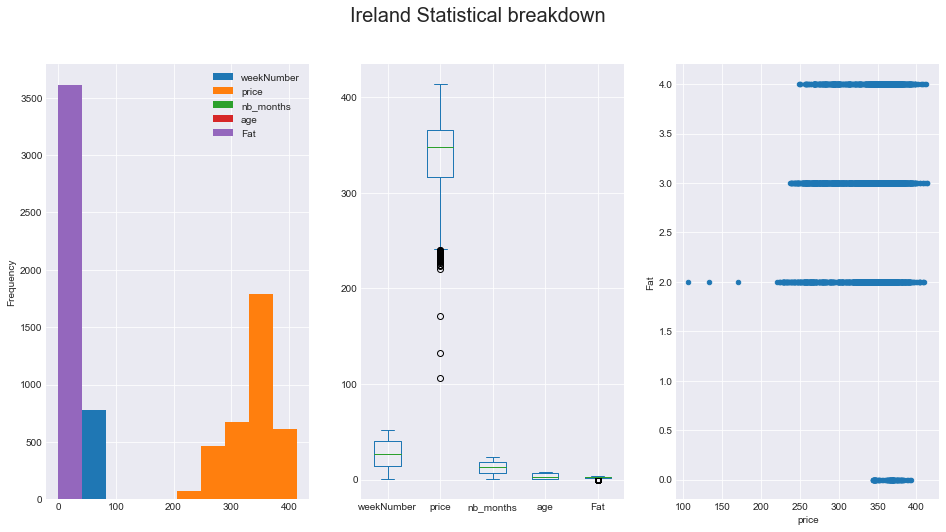

In [77]:
statPlot(df_IE,"Ireland Statistical breakdown")

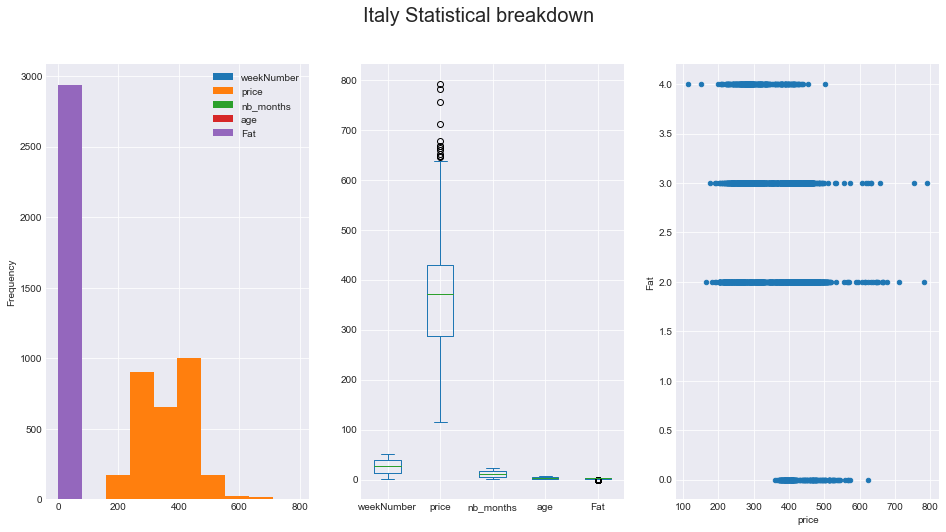

In [78]:
statPlot(df_IT, "Italy Statistical breakdown")

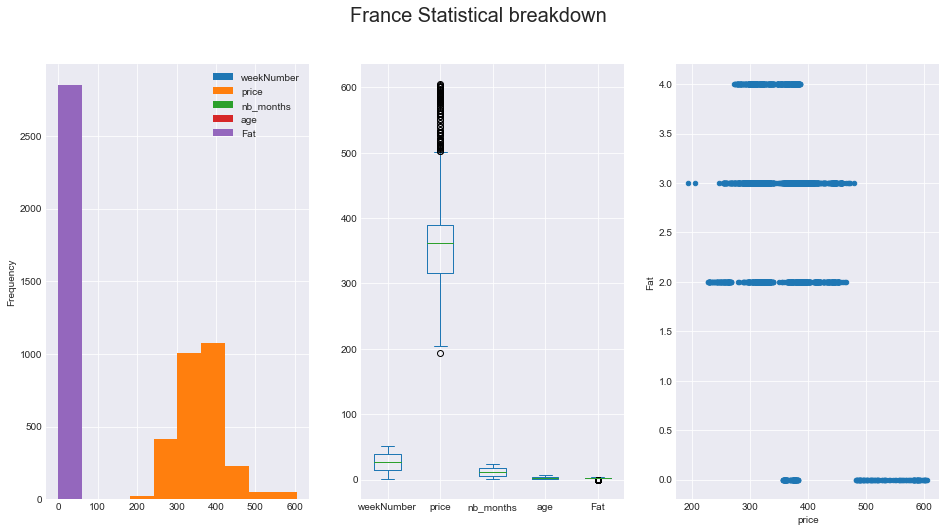

In [79]:
statPlot(df_FR,"France Statistical breakdown")

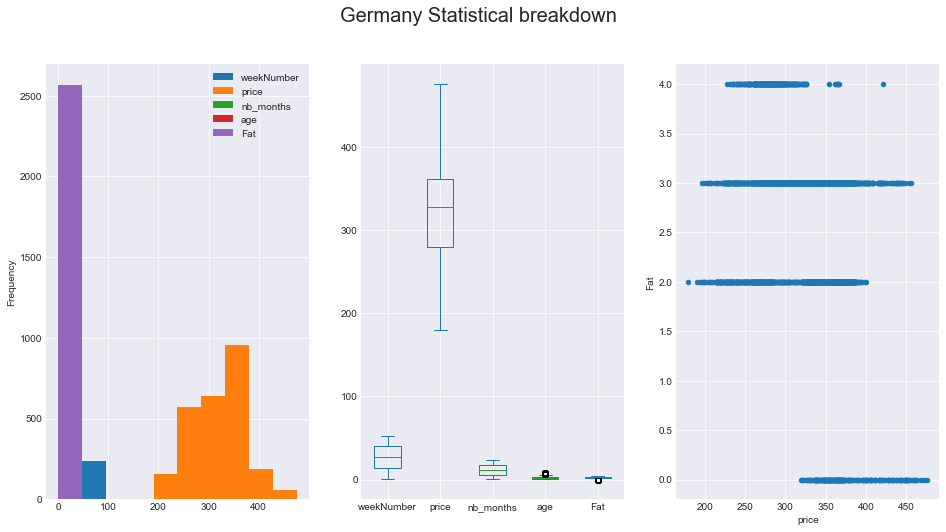

In [80]:
statPlot(df_DE,"Germany Statistical breakdown")

In [81]:
df_IE.head() #Test Ireland was successful

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat
51,IE,Ireland,2020-12-21,2020-12-27,52,362.43,€/100Kg,Young cattle,Z R3,12,24,2020,Monday,8,R,3
52,IE,Ireland,2020-12-21,2020-12-27,52,368.16,€/100Kg,Young bulls,A U3,12,24,2020,Monday,3,U,3
53,IE,Ireland,2020-12-21,2020-12-27,52,381.05,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,R,3
54,IE,Ireland,2020-12-21,2020-12-27,52,291.30,€/100Kg,Cows,D O4,12,24,2020,Monday,2,O,4
55,IE,Ireland,2020-12-21,2020-12-27,52,356.97,€/100Kg,Young bulls,A R2,12,24,2020,Monday,3,R,2


<Figure size 1152x576 with 0 Axes>

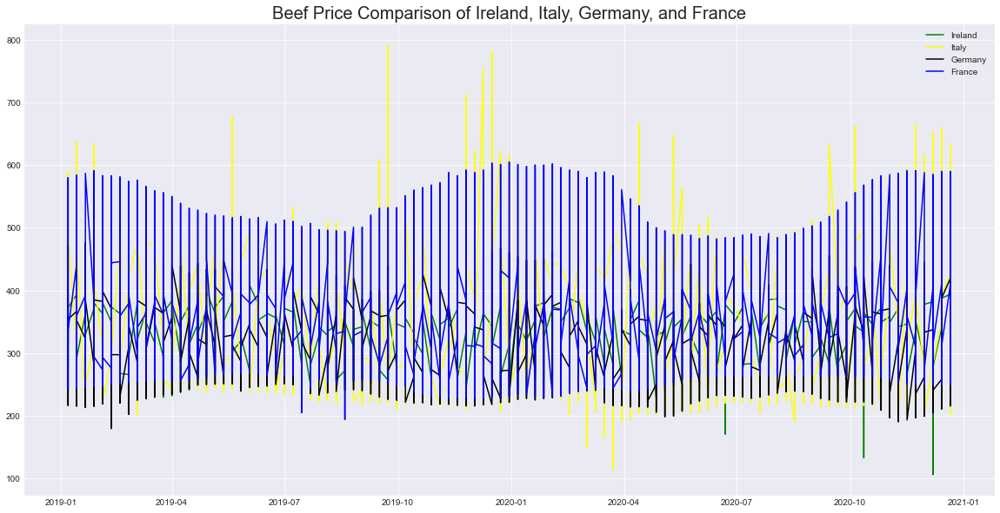

In [82]:
fig = plt.figure()

#for frame in [df_IE, df_IT, df_DE, df_FR,]:    #Loop for graphing but opted for indviually defining them for more stylization
    #plt.plot(frame['beginDate'], frame['price'])
# Create a figure with a custom size
fig = plt.figure(figsize=(20, 10))

# Plot the price data for each dataframe
plt.plot(df_IE['beginDate'], df_IE['price'], color='green', label='Ireland')
plt.plot(df_IT['beginDate'], df_IT['price'], color='yellow', label='Italy')
plt.plot(df_DE['beginDate'], df_DE['price'], color='black', label='Germany')
plt.plot(df_FR['beginDate'], df_FR['price'], color='blue', label='France')

# Add a title and legend
plt.title("Beef Price Comparison of Ireland, Italy, Germany, and France", fontsize=20)
leg = plt.legend()

# Show plot
plt.show()

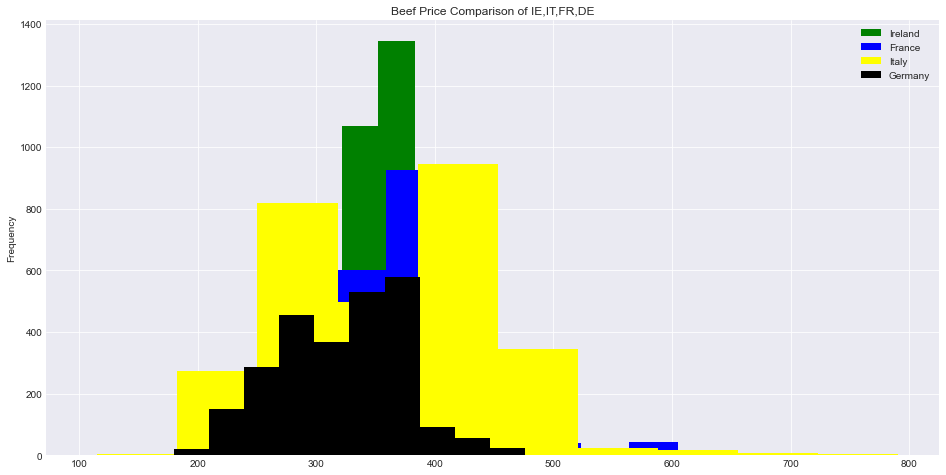

In [83]:


# Create a figure and an axis
fig, ax = plt.subplots()

# Define a list of dataframes and colors
dataframes = [df_IE, df_FR, df_IT, df_DE]
colors = ['green', 'blue', 'yellow', 'black']

# Iterate through dataframes and plot each one with a different color
for df, color in zip(dataframes, colors):
    df['price'].plot.hist(ax=ax, color=color)

# Add title and legend
plt.title("Beef Price Comparison of IE,IT,FR,DE")
plt.legend(['Ireland', 'France', 'Italy', 'Germany'])

# Show plot
plt.show()

<H1>Catagorical Values analysis

In [84]:
df_IE['category'].unique()

['Young cattle', 'Young bulls', 'Heifers', 'Cows', 'Steers', 'Adult male indicative price', 'Bulls']
Categories (8, object): ['Adult male indicative price', 'Bulls', 'Calves slaughtered <8M', 'Cows', 'Heifers', 'Steers', 'Young bulls', 'Young cattle']

<Figure size 1152x576 with 0 Axes>

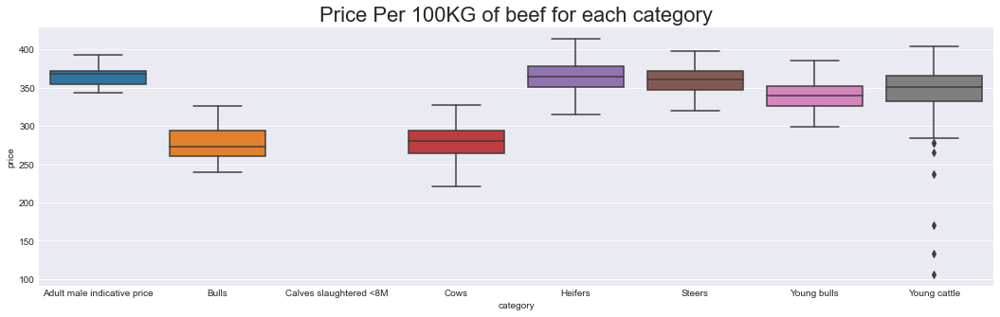

In [85]:
import seaborn as sns
#Create figure and set figure size
plt.figure(figsize=(16, 8))

#Plot boxplot using seaborn's catplot
sns.catplot(x='category', y='price', data=df_IE, kind= "box", height=5, aspect=3)

#Add title and increase font size
plt.title("Price Per 100KG of beef for each category", fontdict = {'fontsize': 22})
sns.set(font_scale = 1.5)

#Adjust layout to make room for the title
plt.tight_layout()

#Show plot
plt.show()

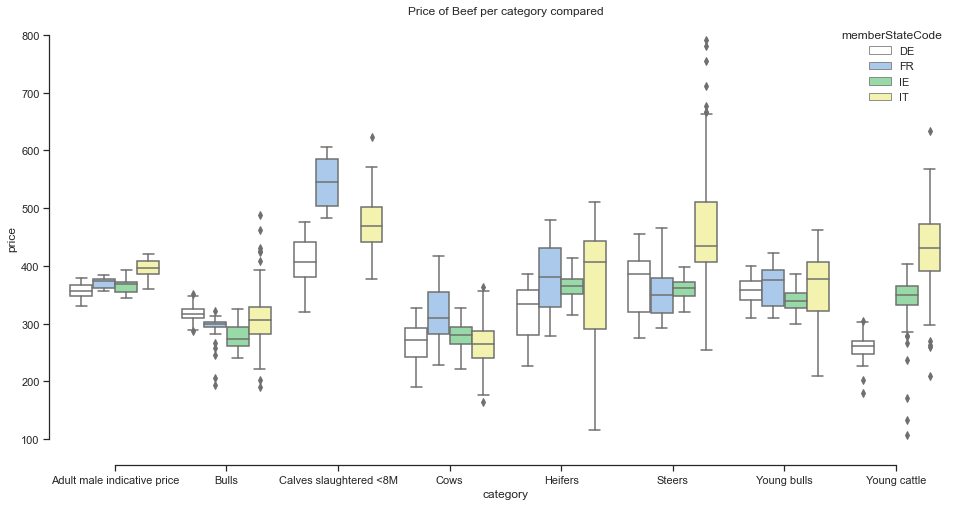

In [86]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset
tips = sns.load_dataset("tips")

# Draw a nested boxplot to show bills by day and time
sns.boxplot(x="category", y="price",
            hue="memberStateCode", palette=["w", "b",'g','y'],
            data=df_beef_stats).set( title = "Price of Beef per category compared" ) 
sns.despine(offset=10, trim=True)
 


In [87]:
import numpy as np
sns.set_theme()

# Load the example flights dataset and convert to long-form
def heatmap(df_country,chartTitle,colour):
    df = df_country.pivot_table(index="Month", columns="Day", values="price",aggfunc={'price':np.mean}) #Need to use Pivot_table as I have dupliate values, I define that the aggregate function will get the mean of these values

    # Draw a heatmap with the numeric values in each cell
    f, ax = plt.subplots(figsize=(9, 6))
    sns.heatmap(df,  annot=True, fmt="g", cmap=colour,linewidths=.5, ax=ax).set(title=chartTitle) #set my heatmap and styles 



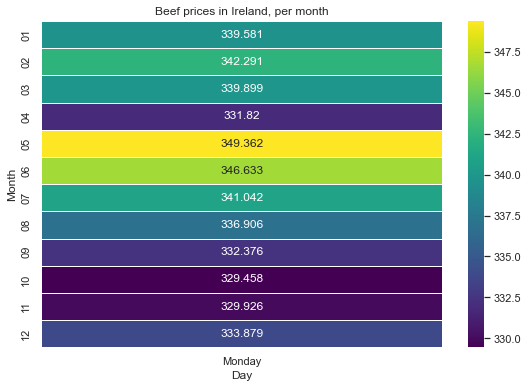

In [88]:
heatmap(df_IE,"Beef prices in Ireland, per month",'viridis') #caluclates the most popular day

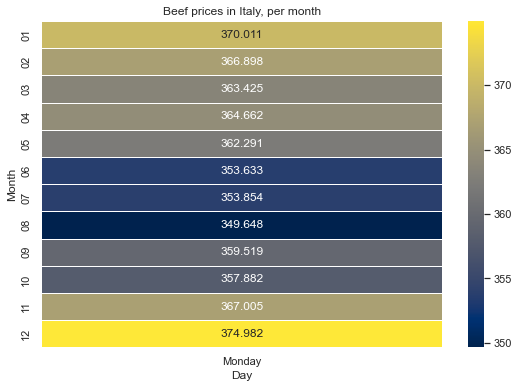

In [89]:
heatmap(df_IT,"Beef prices in Italy, per month","cividis")

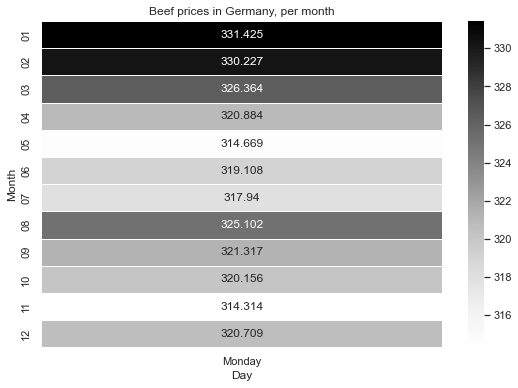

In [90]:
heatmap(df_DE,"Beef prices in Germany, per month","Greys")

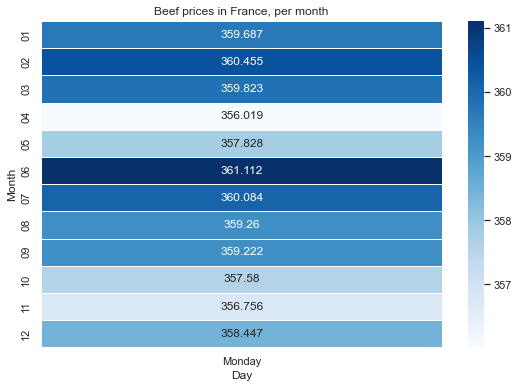

In [91]:
heatmap(df_FR,"Beef prices in France, per month","Blues")

<H1> Statistical analysis

In [92]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy as scipy
from scipy import stats


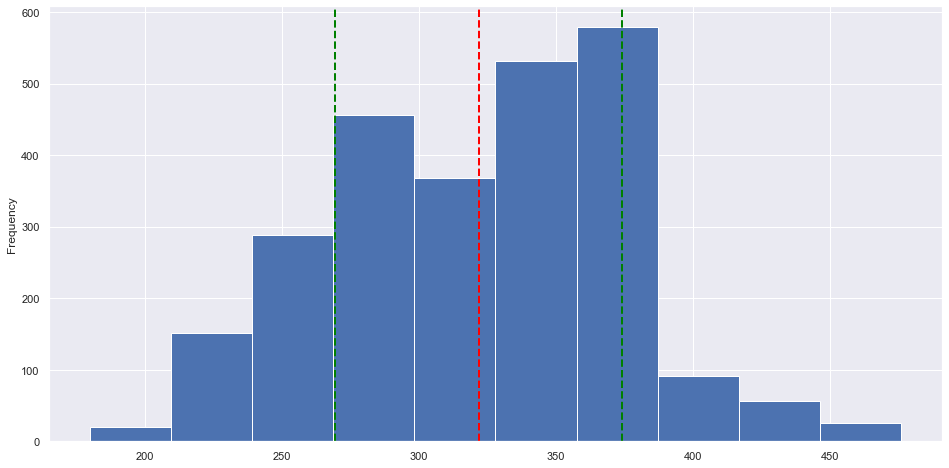

In [93]:
# Calculate mean and standard deviation of price column
mean = df['price'].mean()
std = df['price'].std()

# Plot histogram of price column
df['price'].plot.hist()

# Add vertical lines at mean and +/- one standard deviation
plt.axvline(mean, color='red', linestyle='dashed', linewidth=2)
plt.axvline(mean + std, color='green', linestyle='dashed', linewidth=2)
plt.axvline(mean - std, color='green', linestyle='dashed', linewidth=2)

# Show plot
plt.show()

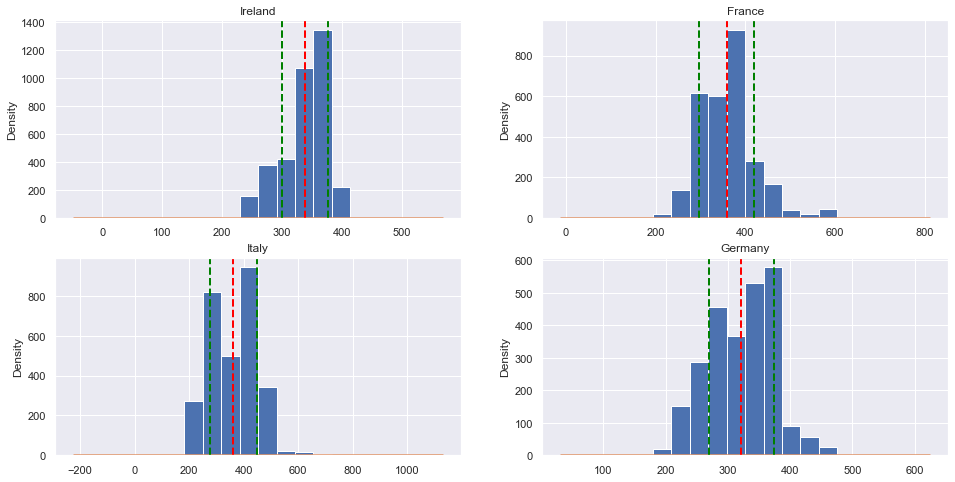

In [94]:
# Create a figure with 2 rows and 2 columns
fig, ax = plt.subplots(2, 2)

# Define a list of dataframes and titles
dataframes = [df_IE, df_FR, df_IT, df_DE]
titles = ['Ireland', 'France', 'Italy', 'Germany']

# Iterate through dataframes and plot each one in a separate subplot
for i, df in enumerate(dataframes):
    # Calculate mean and standard deviation for each dataframe
    mean = df['price'].mean()
    std = df['price'].std()
    
    df['price'].plot.hist(ax=ax[i // 2][i % 2])
    df['price'].plot.density(ax=ax[i // 2][i % 2])
    ax[i // 2][i % 2].set_title(titles[i])
    
    # Add vertical lines at mean and +/- one standard deviation
    ax[i // 2][i % 2].axvline(mean, color='red', linestyle='dashed', linewidth=2)
    ax[i // 2][i % 2].axvline(mean + std, color='green', linestyle='dashed', linewidth=2)
    ax[i // 2][i % 2].axvline(mean - std, color='green', linestyle='dashed', linewidth=2)

# Show plot
plt.show()

In [95]:
#one way anova

<h2>T-Tests

In [96]:
from scipy.stats import ttest_ind


# Perform t-test between df_IE and df_DE
t_statistic, p_value = ttest_ind(df_IE['price'], df_DE['price'])

# Test if p-value is less than 0.05 (null hypothesis is rejected)
if p_value < 0.05:
    print('Prices in Ireland and Germany are significantly different')
else:
    print('Prices in Ireland and Germany are not significantly different')

# Perform t-test between df_FR and df_IT
t_statistic, p_value = ttest_ind(df_FR['price'], df_IT['price'])

# Test if p-value is less than 0.05 (null hypothesis is rejected)
if p_value < 0.05:
    print('Prices in France and Italy are significantly different')
else:
    print('Prices in France and Italy are not significantly different')

Prices in Ireland and Germany are significantly different
Prices in France and Italy are not significantly different


<H2> Anova One-Way Test

In [97]:
from scipy.stats import f_oneway

# Perform one-way ANOVA
f_statistic, p_value = f_oneway(df_IE['price'], df_FR['price'], df_DE['price'], df_IT['price'])

# Test if p-value is less than 0.05 (null hypothesis is rejected)
if p_value < 0.05:
    print('Prices are significantly different')
else:
    print('Prices are not significantly different')

Prices are significantly different


------------------------------------------------------------------

<h2>Kruskal-Wallis</h2>A non-parametric alternative to the one-way ANOVA. It can be used to compare the means of three or more groups, and it does not assume that the data is normally distributed or that the variances are equal.

In [98]:
from scipy.stats import kruskal

# Perform Kruskal-Wallis test
statistic, p_value = kruskal(df_IE['price'], df_DE['price'], df_FR['price'], df_IT['price'])

# Test if p-value is less than 0.05 (null hypothesis is rejected)
if p_value < 0.05:
    print('Prices are significantly different')
else:
    print('Prices are not significantly different')

Prices are significantly different


In [99]:
#Anova with all populations

[Text(0.5, 1.0, 'Beef Prices grouped by country')]

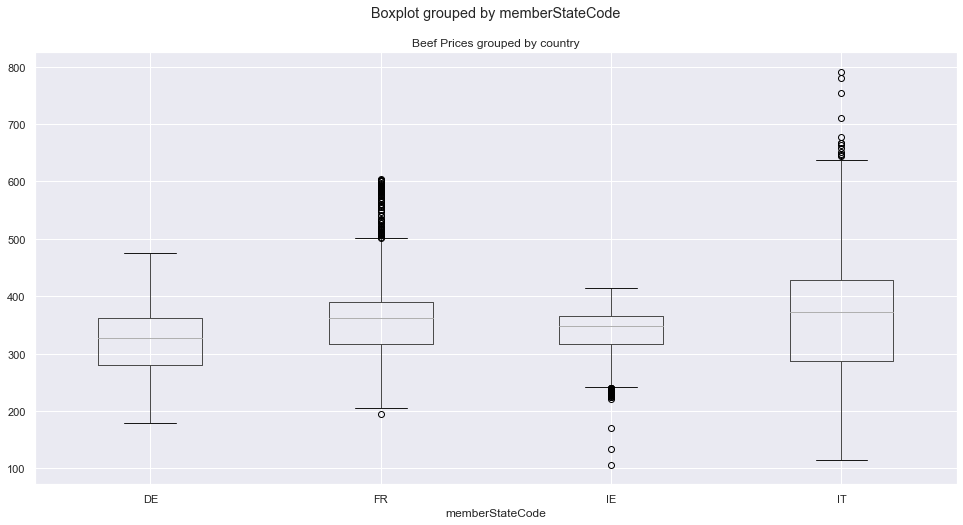

In [100]:
df_beef_stats.boxplot('price', by='memberStateCode').set(title="Beef Prices grouped by country")

In [101]:
#Ireland price t-test
len(df_IE)

3609

In [102]:
stats.ttest_1samp(df_IE['price'],330)

Ttest_1sampResult(statistic=11.892366088824222, pvalue=5.102955777224305e-32)

In [103]:
stats.t.cdf(11.89236608882,3608)

1.0

In [104]:
df_IE['category'].value_counts()

Heifers                        923
Cows                           721
Steers                         721
Young bulls                    618
Young cattle                   420
Adult male indicative price    103
Bulls                          103
Calves slaughtered <8M           0
Name: category, dtype: int64

In [108]:
mod = ols('price ~ memberStateCode',data=df_beef_stats).fit() #linear regression with one way anova
anova_table=sm.stats.anova_lm(mod,typ=2) # create the anova table
print(anova_table)

                       sum_sq       df           F         PR(>F)
memberStateCode  2.951606e+06      3.0  262.307713  7.040289e-165
Residual         4.483729e+07  11954.0         NaN            NaN


In [109]:
import statsmodels.tsa.stattools as sts

In [110]:
sts.adfuller(df_IE['price'])

(-5.200317972174058,
 8.778951178241188e-06,
 30,
 3578,
 {'1%': -3.4321789540671963,
  '5%': -2.8623481292538475,
  '10%': -2.5672001802893964},
 36148.045646567785)

In [111]:
sts.adfuller(df_IE['price'].diff().dropna())

(-19.811762218599448,
 0.0,
 29,
 3578,
 {'1%': -3.4321789540671963,
  '5%': -2.8623481292538475,
  '10%': -2.5672001802893964},
 36160.406930686215)

In [112]:
sts.kpss(df_IE['price'])

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




(0.9883830845440489,
 0.01,
 22,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

In [113]:
from scipy import stats
import scipy as scipy

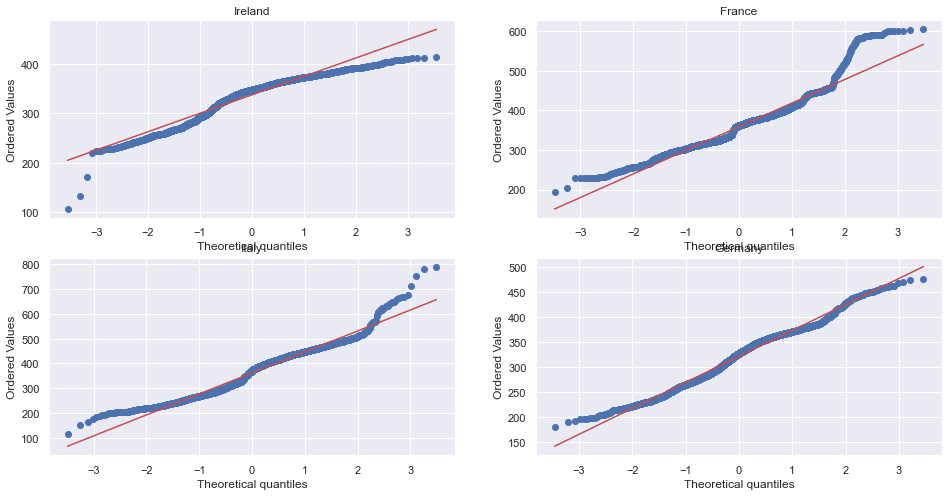

In [128]:
#Create a figure with 4 subplots
fig, ax = plt.subplots(nrows=2, ncols=2)

#Create a list of dataframes to plot
df_list = [df_IE, df_FR, df_IT, df_DE]
titles = ['Ireland', 'France', 'Italy', 'Germany']

#Iterate through dataframes and plot each one in a separate subplot
for i, df in enumerate(df_list):

#Calculate mean and standard deviation of price column
    mean = df['price'].mean()
    std = df['price'].std()

    #Plot probplot of price column in subplot
    stats.probplot(df['price'], plot=ax[i // 2][i % 2])

    #Set title of subplot
    ax[i // 2][i % 2].set_title(titles[i])

#Show plot
plt.show()

In [115]:
stats.shapiro(df_IE['price'])

ShapiroResult(statistic=0.9281525611877441, pvalue=1.5313267705175205e-38)

In [116]:
df_DE['age'].unique() #representitive of these values respectively ['E', 'D', 'A', 'B', 'ACZ', 'CALVES-LT8MONTHS', 'C', 'Z']

array([5, 3, 1, 2, 4, 6, 7, 8])

<h2>ChiSquared

In [129]:
contigency= pd.crosstab(df_DE['category'], df_DE['Fat']) 
contigency

Fat,0,2,3,4
category,,,,
Adult male indicative price,103,0,0,0
Bulls,0,0,102,0
Calves slaughtered <8M,103,0,0,0
Cows,0,206,309,206
Heifers,0,308,309,111
Steers,0,0,162,1
Young bulls,0,309,309,0
Young cattle,0,27,0,0


In [130]:
contigency_pct = pd.crosstab(df_DE['category'], df_DE['Fat'], normalize='columns')
contigency_pct

Fat,0,2,3,4
category,,,,
Adult male indicative price,0.5,0.000000,0.000000,0.000000
Bulls,0.0,0.000000,0.085642,0.000000
Calves slaughtered <8M,0.5,0.000000,0.000000,0.000000
Cows,0.0,0.242353,0.259446,0.647799
Heifers,0.0,0.362353,0.259446,0.349057
Steers,0.0,0.000000,0.136020,0.003145
Young bulls,0.0,0.363529,0.259446,0.000000
Young cattle,0.0,0.031765,0.000000,0.000000


[Text(0.5, 1.0, 'Contingency table of Fat and beef Category in Ireland')]

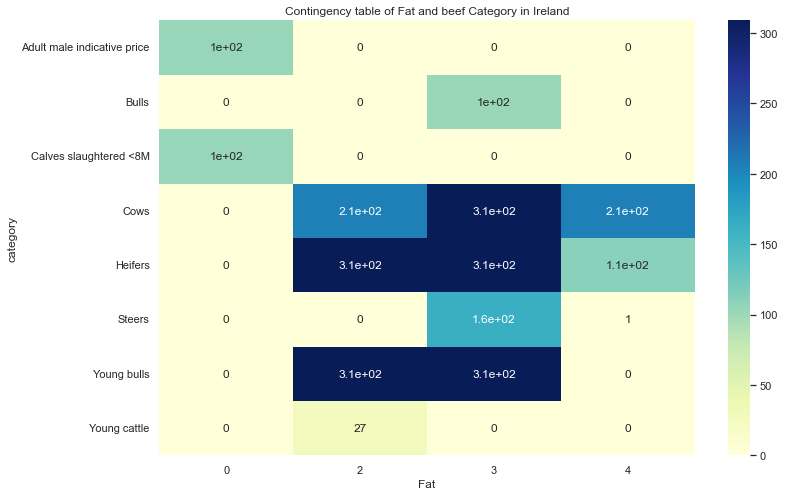

In [131]:
plt.figure(figsize=(12,8)) 
sns.heatmap(contigency, annot=True, cmap="YlGnBu").set(title="Contingency table of Fat and beef Category in Ireland")

In [132]:
from scipy.stats import chi2_contingency

# Chi-square test of independence. 
c, p, dof, expected = chi2_contingency(contigency) 
#Alternatively instead of giving each a varibale names just print all in one with - stats.chi2_contingency(observed = contigency)
# Print the p-value
print(c,p,dof,expected)

3196.6732759645765 0.0 21 [[  8.27212476  34.13255361  47.82573099  12.76959064]
 [  8.19181287  33.80116959  47.36140351  12.64561404]
 [  8.27212476  34.13255361  47.82573099  12.76959064]
 [ 57.90487329 238.92787524 334.78011696  89.3871345 ]
 [ 58.46705653 241.24756335 338.03040936  90.25497076]
 [ 13.09083821  54.01559454  75.68538012  20.20818713]
 [ 49.63274854 204.79532164 286.95438596  76.61754386]
 [  2.16842105   8.94736842  12.53684211   3.34736842]]


In [133]:
stats.chi2_contingency(observed = contigency)

(3196.6732759645765,
 0.0,
 21,
 array([[  8.27212476,  34.13255361,  47.82573099,  12.76959064],
        [  8.19181287,  33.80116959,  47.36140351,  12.64561404],
        [  8.27212476,  34.13255361,  47.82573099,  12.76959064],
        [ 57.90487329, 238.92787524, 334.78011696,  89.3871345 ],
        [ 58.46705653, 241.24756335, 338.03040936,  90.25497076],
        [ 13.09083821,  54.01559454,  75.68538012,  20.20818713],
        [ 49.63274854, 204.79532164, 286.95438596,  76.61754386],
        [  2.16842105,   8.94736842,  12.53684211,   3.34736842]]))

In [134]:
#Get the critical value for comparison
criticalValue = stats.chi2.ppf(q = 0.95, df=18)

print ("critical value: ")
print (criticalValue)

critical value: 
28.869299430392623


In [135]:
#Since this p-value is less than 0.05, indicating that the result under study is statistically significant. That is, the data provide sufficient evidence to warrant the rejection of the null hypothesis.
#H0 - Fat content of the beef is independent of Category
#H1 - Fat content of beef is not independent of Category 

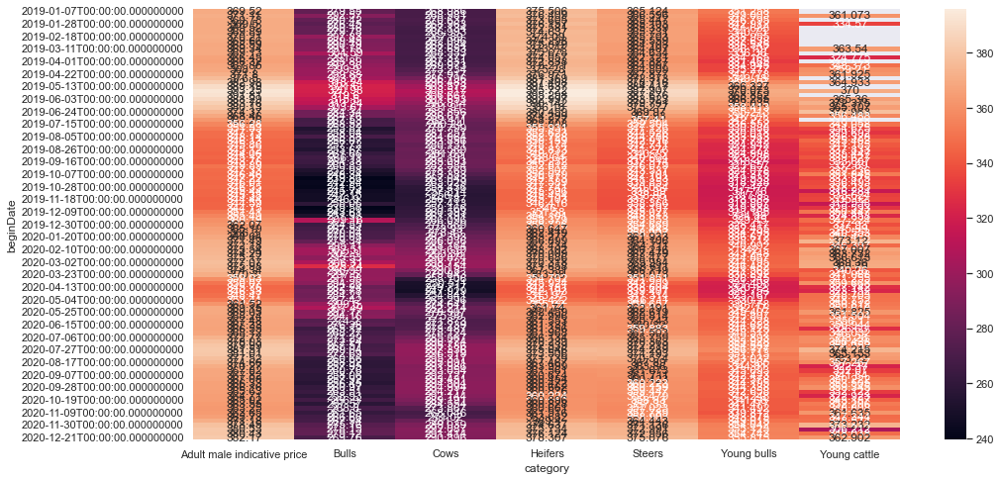

In [136]:
# Create a pivot table with price as the values, date as the index, and category as the columns
pivot_table = df_IE.pivot_table(index='beginDate', columns='category', values='price')

# Create a heatmap from the pivot table
sns.heatmap(pivot_table, annot=True, fmt='g')

# Show plot
plt.show()

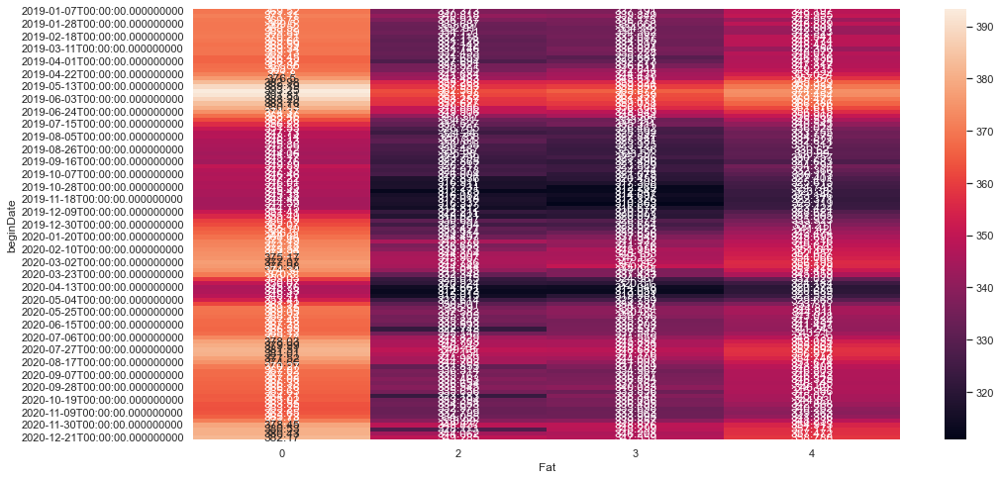

In [137]:
# Create a pivot table with price as the values, date as the index, and category as the columns
pivot_table = df_IE.pivot_table(index='beginDate', columns='Fat', values='price')

# Create a heatmap from the pivot table
sns.heatmap(pivot_table, annot=True, fmt='g')

# Show plot
plt.show()

# Sentient Analysis

In [138]:
#!pip install python-dotenv

In [139]:
#!pip install requests

In [140]:
from dotenv import dotenv_values

config = dotenv_values(".env")

# your Twitter API key and API secret
# We won't be using these variables, they're just for demonstration.
my_api_key = config["API_KEY"]
my_api_key_secret = config["API_KEY_SECRET"]

In [141]:
import requests
import json

# As an alternative to the .env file, you can do this:
# To set your environment variables in your terminal run the following line:
# export 'BEARER_TOKEN'='<your_bearer_token>'
bearer_token = config["BEARER_TOKEN"]

search_url = "https://api.twitter.com/2/tweets/search/recent"

# Optional params: start_time,end_time,since_id,until_id,max_results,next_token,
# expansions,tweet.fields,media.fields,poll.fields,place.fields,user.fields
# query_params = {'query': '(from:twitterdev -is:retweet) OR #twitterdev','tweet.fields': 'author_id', "max_results":"10"}
query_params = {
    'query' : '(Beef OR Beef Prices OR Cost of Beef ) Europe lang:en -is:retweet',
    'tweet.fields': 'author_id', 
    'user.fields': 'name',
    "max_results":"50",
}

def bearer_oauth(r):
    """
    Method required by bearer token authentication.
    """

    r.headers["Authorization"] = f"Bearer {bearer_token}"
    r.headers["User-Agent"] = "v2RecentSearchPython"
    return r

def connect_to_endpoint(url, params):
    response = requests.get(url, auth=bearer_oauth, params=params)
    print(response.status_code)
    if response.status_code != 200:
        raise Exception(response.status_code, response.text)
    return response.json()

# Querying the API
json_response = connect_to_endpoint(search_url, query_params)

# Parsing the response
parsedRes = json.dumps(json_response, indent=4, sort_keys=True, ensure_ascii=False)


print(parsedRes)
json_object = json.loads(parsedRes)

200
{
    "data": [
        {
            "author_id": "1588422811932299264",
            "edit_history_tweet_ids": [
                "1611458298200600576"
            ],
            "id": "1611458298200600576",
            "text": "I LOVE ❤️ ALBERTA BEEF.\nJust how I like my meat - 3D printed…\nMore 3D-printed steaks are coming to Europe – Food\nSubscribe: Edward Snowden Private\nVideo from Edward Snowden https://t.co/Bs5A6JdsI8 https://t.co/1kuw4MBUY2"
        },
        {
            "author_id": "1378497262133854208",
            "edit_history_tweet_ids": [
                "1611457988803579904"
            ],
            "id": "1611457988803579904",
            "text": "@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - here you really do need to look at a map. This is the very bases of the issue - you insert USA into everything. Europe is run by EU and thus defacto Germany. Now if you were from Greece your very big beef would be with Germany. Please explain to me why 🙄"
        },
       

In [142]:
type(json_object)

dict

In [143]:
df_twitter = pd.DataFrame(json_object['data'])

In [144]:
df_twitter

,author_id,edit_history_tweet_ids,id,text
0,1588422811932299264,[1611458298200600576],1611458298200600576,I LOVE ❤️ ALBERTA BEEF.\nJust how I like my me...
1,1378497262133854208,[1611457988803579904],1611457988803579904,@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - her...
2,923560648575016961,[1611444239291846683],1611444239291846683,Via @FJ_PORK: Pork production is expected to d...
3,211582387,[1611428359052922881],1611428359052922881,Podcast of this week’s @lstwrd on the Environm...
4,64353785,[1611419253034389515],1611419253034389515,these Figures along with ONS numbers of our Be...
5,1630717884,[1611418502308446245],1611418502308446245,"Namibian 🇳🇦beef 🥩, one of the best 🥩 in the 🌎...."
6,7424642,[1611387847717576706],1611387847717576706,Sumitomo Mitsui Financial Group plans to exten...
7,143473276,[1611382084211187712],1611382084211187712,Pork production is expected to decline in Euro...
8,1091665680229957635,[1611369424619212801],1611369424619212801,Russia and Belarus beef up joint military grou...
9,1600156009493733376,[1611245785785536515],1611245785785536515,# Fuel returns to levels reached before shale ...


In [145]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [146]:
df_twitter['word_count'] =df_twitter['text'].apply(lambda x: len(str(x).split(" ")))

In [147]:
df_twitter['char_count'] = df_twitter['text'].str.len() 

In [148]:
df_twitter.head()

,author_id,edit_history_tweet_ids,id,text,word_count,char_count
0,1588422811932299264,[1611458298200600576],1611458298200600576,I LOVE ❤️ ALBERTA BEEF.\nJust how I like my me...,29,220
1,1378497262133854208,[1611457988803579904],1611457988803579904,@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - her...,58,297
2,923560648575016961,[1611444239291846683],1611444239291846683,Via @FJ_PORK: Pork production is expected to d...,39,265
3,211582387,[1611428359052922881],1611428359052922881,Podcast of this week’s @lstwrd on the Environm...,27,200
4,64353785,[1611419253034389515],1611419253034389515,these Figures along with ONS numbers of our Be...,52,312


In [149]:
def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word) for word in words)/len(words))

In [150]:
df_twitter['avg_word'] = df_twitter['text'].apply(lambda x: avg_word(x))

In [151]:
from nltk.corpus import stopwords
stop = stopwords.words('english')

In [152]:
df_twitter['stopwords'] = df_twitter['text'].apply(lambda x: len([x for x in x.split() if x in stop]))
df_twitter[['text','stopwords']].head()

,text,stopwords
0,I LOVE ❤️ ALBERTA BEEF.\nJust how I like my me...,5
1,@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - her...,27
2,Via @FJ_PORK: Pork production is expected to d...,12
3,Podcast of this week’s @lstwrd on the Environm...,9
4,these Figures along with ONS numbers of our Be...,20


In [153]:
df_twitter['hastags'] = df_twitter['text'].apply(lambda x: len([x for x in x.split() if x.startswith('#')]))
df_twitter[['text','hastags']].head()

,text,hastags
0,I LOVE ❤️ ALBERTA BEEF.\nJust how I like my me...,0
1,@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - her...,0
2,Via @FJ_PORK: Pork production is expected to d...,1
3,Podcast of this week’s @lstwrd on the Environm...,1
4,these Figures along with ONS numbers of our Be...,0


In [154]:
df_twitter['upper'] = df_twitter['text'].apply(lambda x: len([x for x in x.split() if x.isupper()]))
df_twitter[['text','upper']].head()

,text,upper
0,I LOVE ❤️ ALBERTA BEEF.\nJust how I like my me...,6
1,@GaganisVas @Ditzeltjuh @SamRamani2 Yeah - her...,2
2,Via @FJ_PORK: Pork production is expected to d...,2
3,Podcast of this week’s @lstwrd on the Environm...,0
4,these Figures along with ONS numbers of our Be...,5


In [155]:
df_twitter['text'] = df_twitter['text'].str.replace('[^\w\s]','')
df_twitter['text'].head()

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1896773899.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



0    I LOVE  ALBERTA BEEF\nJust how I like my meat ...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah  here yo...
2    Via FJ_PORK Pork production is expected to dec...
3    Podcast of this weeks lstwrd on the Environmen...
4    these Figures along with ONS numbers of our Be...
Name: text, dtype: object

In [156]:
df_twitter['text'] = df_twitter['text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
df_twitter['text'].head()

0    I LOVE ALBERTA BEEF Just I like meat 3D printe...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah really n...
2    Via FJ_PORK Pork production expected decline E...
3    Podcast weeks lstwrd Environment available Top...
4    Figures along ONS numbers Beef amp Lamb 22 Eur...
Name: text, dtype: object

In [157]:
freq = pd.Series(' '.join(df_twitter['text']).split()).value_counts()[:10]
freq

beef        40
Europe      33
Russia      16
Belarus     14
amp         13
joint       12
grouping    11
military    11
US           9
drills       8
dtype: int64

In [158]:
freq = list(freq.index)
df_twitter['text'] = df_twitter['text'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
df_twitter['text'].head()

0    I LOVE ALBERTA BEEF Just I like meat 3D printe...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah really n...
2    Via FJ_PORK Pork production expected decline n...
3    Podcast weeks lstwrd Environment available Top...
4    Figures along ONS numbers Beef Lamb 22 Cheese ...
Name: text, dtype: object

In [159]:
freq = pd.Series(' '.join(df_twitter['text']).split()).value_counts()[-10:]
freq

accepted              1
think                 1
andrew                1
tate                  1
romania               1
reason                1
DAY316                1
repeatedly            1
warned                1
httpstcoUSh5X3dwmR    1
dtype: int64

In [160]:
freq = list(freq.index)
df_twitter['text'] = df_twitter['text'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
df_twitter['text'].head()

0    I LOVE ALBERTA BEEF Just I like meat 3D printe...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah really n...
2    Via FJ_PORK Pork production expected decline n...
3    Podcast weeks lstwrd Environment available Top...
4    Figures along ONS numbers Beef Lamb 22 Cheese ...
Name: text, dtype: object

In [161]:
#!pip install textblob

In [162]:
from textblob import TextBlob
df_twitter['text'][:5].apply(lambda x: str(TextBlob(x).correct()))

0    I LOVE ALBERTA BEEF Must I like meat Of printe...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah really n...
2    Via FJ_PORK Work production expected decline n...
3    Podcast weeks lstwrd Environment available Top...
4    Figures along ONS numbers Beef Lamb 22 Cheese ...
Name: text, dtype: object

In [163]:
nltk.download('punkt')
TextBlob(df_twitter['text'][1]).words

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


WordList(['GaganisVas', 'Ditzeltjuh', 'SamRamani2', 'Yeah', 'really', 'need', 'look', 'map', 'This', 'bases', 'issue', 'insert', 'USA', 'everything', 'run', 'EU', 'thus', 'defacto', 'Germany', 'Now', 'Greece', 'big', 'would', 'Germany', 'Please', 'explain'])

In [164]:
from nltk.stem import PorterStemmer
st = PorterStemmer()
df_twitter['text'][:5].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))

0    i love alberta beef just i like meat 3d print ...
1    gaganisva ditzeltjuh samramani2 yeah realli ne...
2    via fj_pork pork product expect declin nearli ...
3    podcast week lstwrd environ avail topic includ...
4    figur along on number beef lamb 22 chees franc...
Name: text, dtype: object

In [165]:
nltk.download('wordnet')
from textblob import Word
nltk.download('corpora')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Error loading corpora: Package 'corpora' not found in
[nltk_data]     index


False

In [166]:
nltk.download('wordnet')
from textblob import Word
df_twitter['text'] = df_twitter['text'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
df_twitter['text'].head()

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


0    I LOVE ALBERTA BEEF Just I like meat 3D printe...
1    GaganisVas Ditzeltjuh SamRamani2 Yeah really n...
2    Via FJ_PORK Pork production expected decline n...
3    Podcast week lstwrd Environment available Topi...
4    Figures along ONS number Beef Lamb 22 Cheese F...
Name: text, dtype: object

In [167]:
TextBlob(df_twitter['text'][0]).ngrams(2)

[WordList(['I', 'LOVE']),
 WordList(['LOVE', 'ALBERTA']),
 WordList(['ALBERTA', 'BEEF']),
 WordList(['BEEF', 'Just']),
 WordList(['Just', 'I']),
 WordList(['I', 'like']),
 WordList(['like', 'meat']),
 WordList(['meat', '3D']),
 WordList(['3D', 'printed']),
 WordList(['printed', 'More']),
 WordList(['More', '3Dprinted']),
 WordList(['3Dprinted', 'steak']),
 WordList(['steak', 'coming']),
 WordList(['coming', 'Food']),
 WordList(['Food', 'Subscribe']),
 WordList(['Subscribe', 'Edward']),
 WordList(['Edward', 'Snowden']),
 WordList(['Snowden', 'Private']),
 WordList(['Private', 'Video']),
 WordList(['Video', 'Edward']),
 WordList(['Edward', 'Snowden']),
 WordList(['Snowden', 'httpstcoBs5A6JdsI8']),
 WordList(['httpstcoBs5A6JdsI8', 'httpstco1kuw4MBUY2'])]

In [168]:
tf1 = (df_twitter['text'][1:2]).apply(lambda x: pd.value_counts(x.split(" "))).sum(axis = 0).reset_index()
tf1.columns = ['words','tf']
tf1

,words,tf
0,Germany,2
1,GaganisVas,1
2,everything,1
3,Please,1
4,would,1
5,big,1
6,Greece,1
7,Now,1
8,defacto,1
9,thus,1


In [169]:
import numpy as np

for i,word in enumerate(tf1['words']):
  tf1.loc[i, 'idf'] = np.log(df_twitter.shape[0]/(len(df_twitter[df_twitter['text'].str.contains(word)])))

tf1

,words,tf,idf
0,Germany,2,3.912023
1,GaganisVas,1,3.912023
2,everything,1,3.912023
3,Please,1,3.912023
4,would,1,2.813411
5,big,1,3.218876
6,Greece,1,3.912023
7,Now,1,3.912023
8,defacto,1,3.912023
9,thus,1,3.912023


In [170]:
tf1['tfidf'] = tf1['tf'] * tf1['idf']
tf1

,words,tf,idf,tfidf
0,Germany,2,3.912023,7.824046
1,GaganisVas,1,3.912023,3.912023
2,everything,1,3.912023,3.912023
3,Please,1,3.912023,3.912023
4,would,1,2.813411,2.813411
5,big,1,3.218876,3.218876
6,Greece,1,3.912023,3.912023
7,Now,1,3.912023,3.912023
8,defacto,1,3.912023,3.912023
9,thus,1,3.912023,3.912023


In [171]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1))
twitter_vect = tfidf.fit_transform(df_twitter['text']) # The resulting matrix is stored in the 'twitter_vect' variable.

twitter_vect

<50x583 sparse matrix of type '<class 'numpy.float64'>'
	with 741 stored elements in Compressed Sparse Row format>

In [172]:
print(twitter_vect)

  (0, 263)	0.208070646156287
  (0, 272)	0.208070646156287
  (0, 561)	0.1881669455123244
  (0, 433)	0.208070646156287
  (0, 493)	0.416141292312574
  (0, 165)	0.416141292312574
  (0, 508)	0.208070646156287
  (0, 204)	0.17404504516575373
  (0, 106)	0.208070646156287
  (0, 501)	0.208070646156287
  (0, 14)	0.208070646156287
  (0, 432)	0.208070646156287
  (0, 13)	0.208070646156287
  (0, 365)	0.17404504516575373
  (0, 347)	0.14657430873007862
  (0, 328)	0.208070646156287
  (0, 58)	0.12906564727094055
  (0, 29)	0.208070646156287
  (0, 353)	0.208070646156287
  (1, 181)	0.21943564378724575
  (1, 62)	0.18355153520905929
  (1, 234)	0.21943564378724575
  (1, 218)	0.4388712875744915
  (1, 136)	0.21943564378724575
  (1, 174)	0.17199943249775249
  :	:
  (48, 498)	0.30834959405389795
  (48, 219)	0.30834959405389795
  (48, 372)	0.30834959405389795
  (48, 197)	0.30834959405389795
  (48, 243)	0.30834959405389795
  (48, 303)	0.2788533718471081
  (48, 175)	0.25792546913917924
  (49, 552)	0.21368946451483228

In [173]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer(max_features=1000, lowercase=True, ngram_range=(1,1),analyzer = "word")
train_bow = bow.fit_transform(df_twitter['text'])
train_bow

<50x648 sparse matrix of type '<class 'numpy.int64'>'
	with 824 stored elements in Compressed Sparse Row format>

In [174]:
print(train_bow)

  (0, 378)	1
  (0, 30)	1
  (0, 67)	1
  (0, 351)	1
  (0, 372)	1
  (0, 392)	1
  (0, 13)	1
  (0, 476)	1
  (0, 406)	1
  (0, 14)	1
  (0, 547)	1
  (0, 115)	1
  (0, 220)	1
  (0, 555)	1
  (0, 175)	2
  (0, 538)	2
  (0, 477)	1
  (0, 618)	1
  (0, 294)	1
  (0, 285)	1
  (1, 234)	1
  (1, 160)	1
  (1, 516)	1
  (1, 644)	1
  (1, 494)	1
  :	:
  (48, 139)	1
  (48, 152)	1
  (48, 601)	1
  (48, 353)	1
  (49, 372)	1
  (49, 417)	2
  (49, 576)	1
  (49, 163)	1
  (49, 188)	1
  (49, 457)	1
  (49, 327)	1
  (49, 39)	1
  (49, 485)	1
  (49, 334)	1
  (49, 488)	1
  (49, 441)	1
  (49, 447)	1
  (49, 265)	1
  (49, 410)	1
  (49, 146)	1
  (49, 430)	1
  (49, 62)	2
  (49, 275)	1
  (49, 568)	1
  (49, 608)	1


In [175]:
df_twitter['text'][:5].apply(lambda x: TextBlob(x).sentiment)

0       (0.3333333333333333, 0.4916666666666667)
1    (-0.20000000000000004, 0.43333333333333335)
2                                     (0.0, 0.4)
3                                    (0.45, 0.7)
4                                     (0.5, 0.5)
Name: text, dtype: object

In [176]:
df_twitter['sentiment'] = df_twitter['text'].apply(lambda x: TextBlob(x).sentiment[0] )
df_twitter[['text','sentiment']].head()

,text,sentiment
0,I LOVE ALBERTA BEEF Just I like meat 3D printe...,0.333333
1,GaganisVas Ditzeltjuh SamRamani2 Yeah really n...,-0.200000
2,Via FJ_PORK Pork production expected decline n...,0.000000
3,Podcast week lstwrd Environment available Topi...,0.450000
4,Figures along ONS number Beef Lamb 22 Cheese F...,0.500000


In [177]:
df_twitter.head(5)

,author_id,edit_history_tweet_ids,id,text,word_count,char_count,avg_word,stopwords,hastags,upper,sentiment
0,1588422811932299264,[1611458298200600576],1611458298200600576,I LOVE ALBERTA BEEF Just I like meat 3D printe...,29,220,5.696970,5,0,6,0.333333
1,1378497262133854208,[1611457988803579904],1611457988803579904,GaganisVas Ditzeltjuh SamRamani2 Yeah really n...,58,297,4.137931,27,0,2,-0.200000
2,923560648575016961,[1611444239291846683],1611444239291846683,Via FJ_PORK Pork production expected decline n...,39,265,5.820513,12,1,2,0.000000
3,211582387,[1611428359052922881],1611428359052922881,Podcast week lstwrd Environment available Topi...,27,200,6.142857,9,1,0,0.450000
4,64353785,[1611419253034389515],1611419253034389515,Figures along ONS number Beef Lamb 22 Cheese F...,52,312,5.019231,20,0,5,0.500000


<H1> Jupyter Dash

I chose dash over other dashboard options as dash is dynamic and any change to input data will quickly be 
represented visually on my dash

In [178]:
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
from dash import html
import dash_html_components as html
from dash.dependencies import Input, Output

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\4183222288.py:3: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\4183222288.py:5: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`



In [179]:

# Load Data

df = px.data.tips()
# Build App
app = JupyterDash(__name__) #create an instnacae of jupyter dash called app
app.layout = html.Div([      #Seeing as the dash is dynamic page we use html
    html.H1("JupyterDash european Beef Prices"), # passing in labels and styles
    dcc.Graph(id='graph'),
    html.Label([
        "Country",
        dcc.Dropdown( #Defining my dropdown 
            id='dropdown', clearable=False,
            value='Ireland', options=[ #passing in my default values and values
                {'label': c, 'value': c}
                for c in df_beef_stats['memberStateName'].unique() #options in dropdown that are present in colourscales()
            ])
    ]),
])
# Define callback to update graph
@app.callback(
    Output('graph', 'figure'),
    [Input("dropdown", "value")]
)
def update_figure(colorscale):  
    df_filtered = df_beef_stats.loc[df_beef_stats['memberStateName'] == colorscale]
    return px.scatter( 
        df_filtered, x="endDate", y="price",
        color_continuous_scale=colorscale,
        render_mode="webgl", title="Price of Beef in each region"
    )
# Run app and display result inline in the notebook
app.run_server(mode='inline')

In [180]:
#pip install panel

<h1> Using Panel For Dashboard creation - Data preprocessing

In [181]:
import panel as pn
pn.extension('tabulator')

import hvplot.pandas

In [182]:
df_beef_stats['price_per_kg'] = (df_beef_stats['price']/ 100)

In [183]:
df_beef_stats['Month'] = df_beef_stats['Month'].astype('int64')

In [184]:
seperateColumn(df_beef_stats)

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\3219898421.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.



,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,price_per_kg,age,quality,Fat
0,FR,France,2020-12-21,2020-12-27,52,398.00,€/100Kg,Young bulls,A U2,12,24,2020,Monday,3.9800,3,U,2
1,FR,France,2020-12-21,2020-12-27,52,315.00,€/100Kg,Cows,D O2,12,24,2020,Monday,3.1500,2,O,2
2,FR,France,2020-12-21,2020-12-27,52,250.00,€/100Kg,Cows,D P2,12,24,2020,Monday,2.5000,2,P,2
3,FR,France,2020-12-21,2020-12-27,52,365.00,€/100Kg,Young bulls,A R3,12,24,2020,Monday,3.6500,3,R,3
4,FR,France,2020-12-21,2020-12-27,52,417.00,€/100Kg,Steers,C U3,12,24,2020,Monday,4.1700,7,U,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11953,IT,Italy,2019-01-07,2019-01-13,2,415.99,€/100Kg,Adult male indicative price,ACZ URO,1,1,2019,Monday,4.1599,5,URO,NaN
11954,IT,Italy,2019-01-07,2019-01-13,2,281.91,€/100Kg,Heifers,E O2,1,1,2019,Monday,2.8191,1,O,2
11955,IT,Italy,2019-01-07,2019-01-13,2,590.00,€/100Kg,Steers,C U2,1,1,2019,Monday,5.9000,7,U,2
11956,IT,Italy,2019-01-07,2019-01-13,2,451.82,€/100Kg,Heifers,E U2,1,1,2019,Monday,4.5182,1,U,2


In [185]:
df_beef_stats['Fat'] = df_beef_stats['Fat'].fillna(0) #replace nan with 0
df_beef_stats['price_per_kg'] = df_beef_stats['price_per_kg'].fillna(0)
df_beef_stats['Fat'] = df_beef_stats['Fat'].astype('float') # convert to float
df_beef_stats['quality'] = df_beef_stats['quality'].astype('str') #convert to string from category

In [186]:
df_beef_stats['quality'].replace(['E','U','R','O','P'], #Actual quality rating, E being the best and P the worst
                        [1,2,3,4,5], inplace=True)

In [187]:
df_beef_stats

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,price_per_kg,age,quality,Fat
0,FR,France,2020-12-21,2020-12-27,52,398.00,€/100Kg,Young bulls,A U2,12,24,2020,Monday,3.9800,3,2,2.0
1,FR,France,2020-12-21,2020-12-27,52,315.00,€/100Kg,Cows,D O2,12,24,2020,Monday,3.1500,2,4,2.0
2,FR,France,2020-12-21,2020-12-27,52,250.00,€/100Kg,Cows,D P2,12,24,2020,Monday,2.5000,2,5,2.0
3,FR,France,2020-12-21,2020-12-27,52,365.00,€/100Kg,Young bulls,A R3,12,24,2020,Monday,3.6500,3,3,3.0
4,FR,France,2020-12-21,2020-12-27,52,417.00,€/100Kg,Steers,C U3,12,24,2020,Monday,4.1700,7,2,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11953,IT,Italy,2019-01-07,2019-01-13,2,415.99,€/100Kg,Adult male indicative price,ACZ URO,1,1,2019,Monday,4.1599,5,URO,0.0
11954,IT,Italy,2019-01-07,2019-01-13,2,281.91,€/100Kg,Heifers,E O2,1,1,2019,Monday,2.8191,1,4,2.0
11955,IT,Italy,2019-01-07,2019-01-13,2,590.00,€/100Kg,Steers,C U2,1,1,2019,Monday,5.9000,7,2,2.0
11956,IT,Italy,2019-01-07,2019-01-13,2,451.82,€/100Kg,Heifers,E U2,1,1,2019,Monday,4.5182,1,2,2.0


In [188]:
df_beef_stats['quality'].unique()

array([2, 4, 5, 3, 'None', 'URO'], dtype=object)

In [189]:
values = ['None', 'URO']

#drop rows that contain any value in the list
df_beef_stats = df_beef_stats[df_beef_stats.quality.isin(values) == False]

In [190]:
df_beef_stats['quality'] = df_beef_stats['quality'].astype('float')

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\2180352018.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<H1> Dashboard development with Panel

In [191]:
idf = df_beef_stats.interactive()

In [192]:
month_slider = pn.widgets.IntSlider(name='month slider', start=1, end=24, step=1, value=12)
month_slider

IntSlider(end=24, name='month slider', start=1, value=12)

In [193]:
yaxis_price = pn.widgets.RadioButtonGroup(
    name='Y axis', 
    options=['price', 'price_per_kg',],
    button_type='success'
)

In [194]:
df_beef_stats.head()

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,price_per_kg,age,quality,Fat
0,FR,France,2020-12-21,2020-12-27,52,398.0,€/100Kg,Young bulls,A U2,12,24,2020,Monday,3.98,3,2.0,2.0
1,FR,France,2020-12-21,2020-12-27,52,315.0,€/100Kg,Cows,D O2,12,24,2020,Monday,3.15,2,4.0,2.0
2,FR,France,2020-12-21,2020-12-27,52,250.0,€/100Kg,Cows,D P2,12,24,2020,Monday,2.50,2,5.0,2.0
3,FR,France,2020-12-21,2020-12-27,52,365.0,€/100Kg,Young bulls,A R3,12,24,2020,Monday,3.65,3,3.0,3.0
4,FR,France,2020-12-21,2020-12-27,52,417.0,€/100Kg,Steers,C U3,12,24,2020,Monday,4.17,7,2.0,3.0


In [195]:
countrys = ['Ireland', 'France', 'Germany', 'Italy']

price_pipeline = (
    idf[
        (idf.nb_months <= month_slider) &
        (idf.memberStateName.isin(countrys))
    ]
    .groupby(['memberStateName', 'nb_months'])[yaxis_price].mean()
    .to_frame()
    .reset_index()
    .sort_values(by='nb_months')  
    .reset_index(drop=True)
)

In [196]:
price_pipeline

In [197]:
price_plot = price_pipeline.hvplot(x = 'nb_months', by='memberStateName', y=yaxis_price,line_width=2, title="price emission by continent")
price_plot

In [198]:
price_table = price_pipeline.pipe(pn.widgets.Tabulator, pagination='remote', page_size = 10, sizing_mode='stretch_width') 
price_table

In [199]:
price_vs_Fat_scatterplot_pipeline = (
    idf[
        (idf.nb_months <= month_slider) &
        (idf.memberStateName.isin(countrys))
    ]
    .groupby(['memberStateName', 'nb_months', 'Fat'])['price_per_kg'].mean()
    .to_frame()
    .reset_index()
    .sort_values(by='nb_months')  
    .reset_index(drop=True)
)

In [200]:
price_vs_Fat_scatterplot_pipeline

In [221]:
price_vs_Fat_scatterplot = price_vs_Fat_scatterplot_pipeline.hvplot(x='Fat', 
                                                                y='price_per_kg', 
                                                                by='memberStateName', 
                                                                size=80, kind="scatter",
                                                                title="Price base on Fat content of Beef",
                                                                alpha=0.8,
                                                                legend=True, 
                                                                height=600, 
                                                                width=800,
                                                                ylim=(0,5),xlim=(1,5))
price_vs_Fat_scatterplot

In [213]:
#Bar chart

In [214]:
df_beef_stats['category'].unique()

['Young bulls', 'Cows', 'Steers', 'Bulls', 'Heifers', 'Young cattle']
Categories (8, object): ['Adult male indicative price', 'Bulls', 'Calves slaughtered <8M', 'Cows', 'Heifers', 'Steers', 'Young bulls', 'Young cattle']

In [215]:
yaxis_price_source = pn.widgets.RadioButtonGroup(
    name='Y axis', 
    options=['price_per_kg','Fat','quality'], 
    button_type='success'
)

countrys_excl_world  = ['Cows', 'Heifers', 'Young bulls', 'Bulls', 'Steers', 'Calves slaughtered <8M', 'Adult male indicative price', 'Young cattle']

price_source_bar_pipeline = (
    idf[
        (idf.nb_months == month_slider) &
        (idf.category.isin(countrys_excl_world))
    ]
    .groupby(['nb_months', 'category'])[yaxis_price_source].sum()
    .to_frame()
    .reset_index()
    .sort_values(by='nb_months')  
    .reset_index(drop=True)
)

In [216]:
price_source_bar_plot = price_source_bar_pipeline.hvplot(kind='bar', 
                                                     x='category', 
                                                     y=yaxis_price_source, 
                                                     title='Cow category and variable comparison',
                                                    legend=True, 
                                                    height=600, 
                                                    width=800)
price_source_bar_plot

In [222]:
#Layout using Template
template = pn.template.FastListTemplate(
    title='European Beef breakdown dashboard', 
    sidebar=[pn.pane.Markdown("# Beef prices and category"), 
             pn.pane.Markdown("#### Beef Prices are dependant on many factors, category and Fat content of the animal. It is believed the age of the cow has a bearing on the quality of meat and fat ratio"), 
             #pn.pane.PNG('climate_day.png', sizing_mode='scale_both'),
             pn.pane.Markdown("## Settings"),   
             month_slider],
    main=[pn.Row(pn.Column(yaxis_price, 
                           price_plot.panel(width=700), margin=(0,25)), 
                 price_table.panel(width=500)), 
          pn.Row(pn.Column(price_vs_Fat_scatterplot.panel(width=600), margin=(0,25)), #defining our graph
                 pn.Column(yaxis_price_source, price_source_bar_plot.panel(width=600)))],
    accent_base_color="#88d8b0",
    header_background="#88d8b0",
)
template.show()
template.servable();

Launching server at http://localhost:49774


In [223]:
df_beef_stats['age'].value_counts()

1    3168
2    2875
3    2470
7    1434
8     919
4     371
Name: age, dtype: int64

In [224]:
df_beef_stats[['age','category']].head(10)


,age,category
0,3,Young bulls
1,2,Cows
2,2,Cows
3,3,Young bulls
4,7,Steers
5,2,Cows
6,4,Bulls
7,7,Steers
8,3,Young bulls
9,1,Heifers


<H1> Machine Learning

In [225]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import validation_curve
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [226]:
def convertCol2(df_beef_stats):   
    df_beef_stats.loc[:, 'price_per_kg'] = df_beef_stats['price'] / 100
    df_beef_stats.loc[:, 'Month'] = df_beef_stats['Month'].astype('int64')
    df_beef_stats.loc[:, 'Fat'] = df_beef_stats['Fat'].fillna(0)
    df_beef_stats.loc[:, 'price_per_kg'] = df_beef_stats['price_per_kg'].fillna(0)
    df_beef_stats.loc[:, 'Fat'] = df_beef_stats['Fat'].astype('float')
    df_beef_stats.loc[:, 'quality'] = df_beef_stats['quality'].astype('str')
    df_beef_stats.loc[:, 'quality'].replace(['E','U','R','O','P'],[1,2,3,4,5], inplace=True) #Actual quality rating, E being the best and P the worst                
    values = ['None', 'URO']
    #drop rows that contain any value in the list
    df_beef_stats = df_beef_stats[df_beef_stats.quality.isin(values) == False]
    df_beef_stats.loc[:, 'quality'] = df_beef_stats['quality'].astype('float')
    return df_beef_stats

In [227]:
df_IE

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat
51,IE,Ireland,2020-12-21,2020-12-27,52,362.43,€/100Kg,Young cattle,Z R3,12,24,2020,Monday,8,R,3
52,IE,Ireland,2020-12-21,2020-12-27,52,368.16,€/100Kg,Young bulls,A U3,12,24,2020,Monday,3,U,3
53,IE,Ireland,2020-12-21,2020-12-27,52,381.05,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,R,3
54,IE,Ireland,2020-12-21,2020-12-27,52,291.30,€/100Kg,Cows,D O4,12,24,2020,Monday,2,O,4
55,IE,Ireland,2020-12-21,2020-12-27,52,356.97,€/100Kg,Young bulls,A R2,12,24,2020,Monday,3,R,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11924,IE,Ireland,2019-01-07,2019-01-13,2,373.11,€/100Kg,Heifers,E R2,01,1,2019,Monday,1,R,2
11925,IE,Ireland,2019-01-07,2019-01-13,2,295.77,€/100Kg,Cows,D R3,01,1,2019,Monday,2,R,3
11926,IE,Ireland,2019-01-07,2019-01-13,2,268.87,€/100Kg,Cows,D O4,01,1,2019,Monday,2,O,4
11927,IE,Ireland,2019-01-07,2019-01-13,2,254.47,€/100Kg,Cows,D P3,01,1,2019,Monday,2,P,3


In [359]:
df_IE = convertCol2(df_IE)
df_IT = convertCol2(df_IT)
df_FR = convertCol2(df_FR)
df_DE = convertCol2(df_DE)

In [229]:
df_IE['age'] = df_IE['age'].astype('int')

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1562674270.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



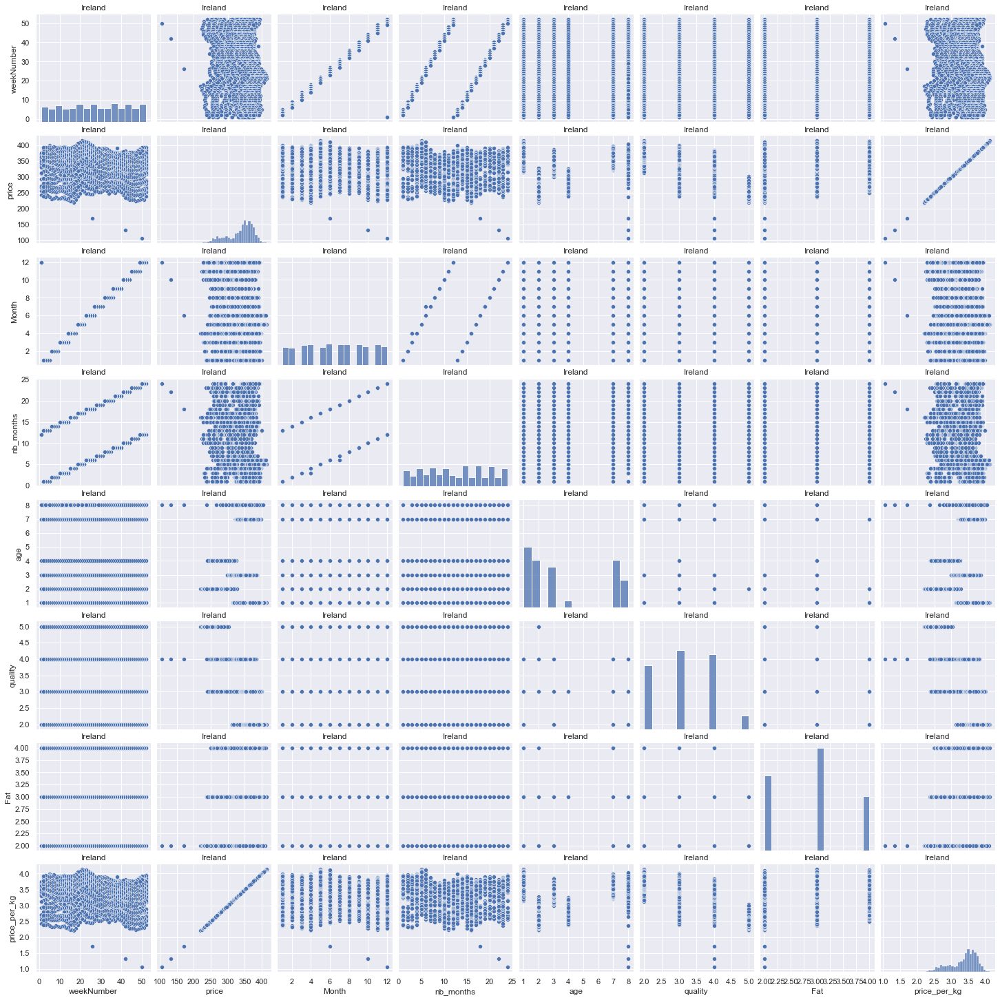

In [286]:
sns.pairplot(df_IE).set(title="Ireland")
sns.set(font_scale=0.01)
plt.tight_layout()
plt.show()

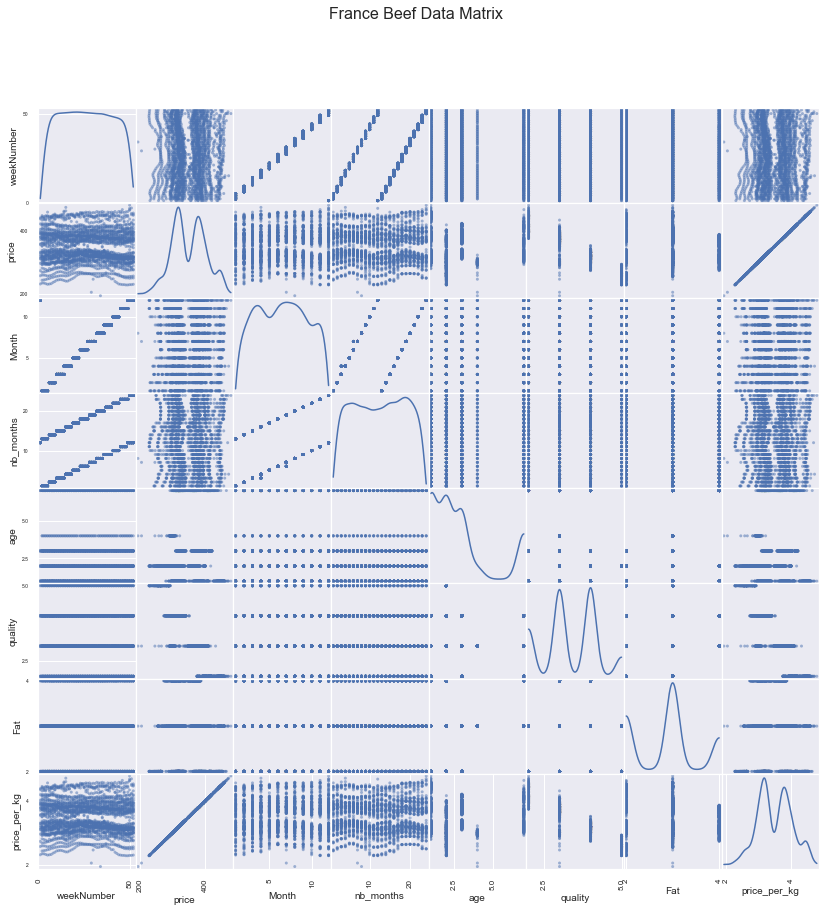

In [360]:
from pandas.plotting import scatter_matrix #using pandas instead of Seaborn as an alternative to pairplot!

Axes = scatter_matrix(df_FR, figsize=(14, 14), diagonal='kde')
#y ticklabels
[plt.setp(item.yaxis.get_majorticklabels(), 'size', 5) for item in Axes.ravel()]
#x ticklabels
[plt.setp(item.xaxis.get_label(), 'size', 10) for item in Axes.ravel()]
#y labels
[plt.setp(item.yaxis.get_label(), 'size', 10) for item in Axes.ravel()]

plt.suptitle("France Beef Data Matrix", fontsize=16)

plt.show()

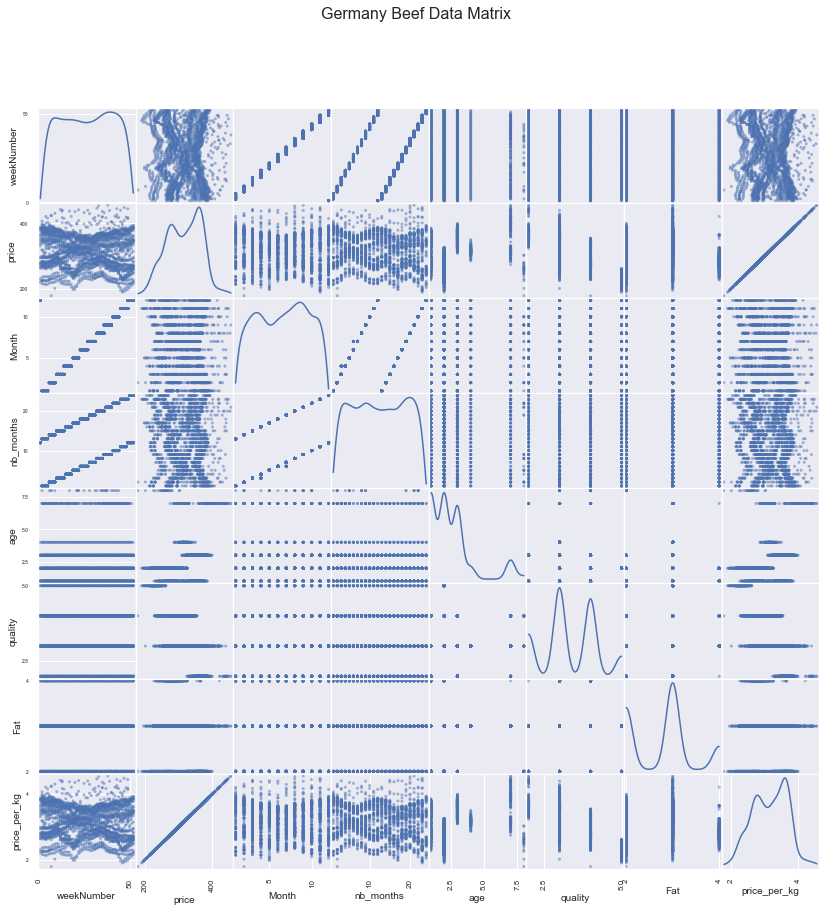

In [361]:
Axes = scatter_matrix(df_DE, figsize=(14, 14), diagonal='kde')
#y ticklabels
[plt.setp(item.yaxis.get_majorticklabels(), 'size', 5) for item in Axes.ravel()]
#x ticklabels
[plt.setp(item.xaxis.get_label(), 'size', 10) for item in Axes.ravel()]
#y labels
[plt.setp(item.yaxis.get_label(), 'size', 10) for item in Axes.ravel()]

plt.suptitle("Germany Beef Data Matrix", fontsize=16)
plt.show()

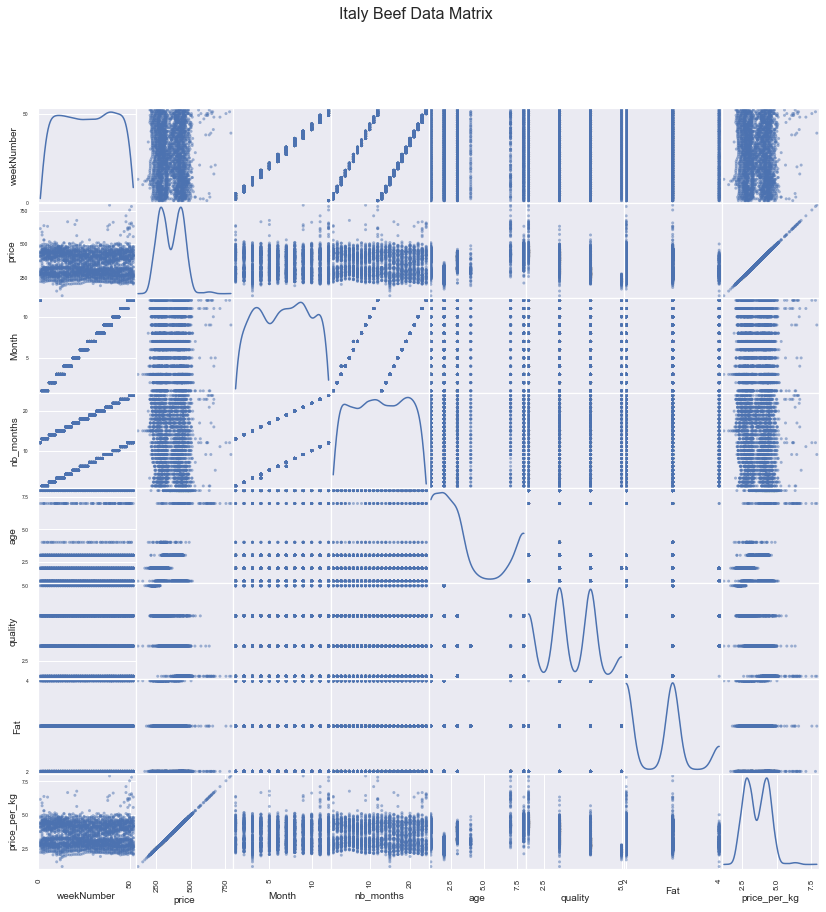

In [362]:
Axes = scatter_matrix(df_IT, figsize=(14, 14), diagonal='kde')
#y ticklabels
[plt.setp(item.yaxis.get_majorticklabels(), 'size', 5) for item in Axes.ravel()]
#x ticklabels
[plt.setp(item.xaxis.get_label(), 'size', 10) for item in Axes.ravel()]
#y labels
[plt.setp(item.yaxis.get_label(), 'size', 10) for item in Axes.ravel()]
plt.suptitle("Italy Beef Data Matrix", fontsize=16)
plt.show()

In [233]:
#Timeseries Analysis

In [234]:
targets = ['price']
features = [feature for feature in df_IT.columns if feature not in targets]
df_IT.head()

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat
86,IT,Italy,2020-12-21,2020-12-27,52,474.00,€/100Kg,Young cattle,Z U2,12,24,2020,Monday,8,U,2
87,IT,Italy,2020-12-21,2020-12-27,52,254.56,€/100Kg,Cows,D O3,12,24,2020,Monday,2,O,3
88,IT,Italy,2020-12-21,2020-12-27,52,416.08,€/100Kg,Young cattle,Z R2,12,24,2020,Monday,8,R,2
89,IT,Italy,2020-12-21,2020-12-27,52,269.25,€/100Kg,Cows,D R3,12,24,2020,Monday,2,R,3
90,IT,Italy,2020-12-21,2020-12-27,52,412.36,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,R,3


In [235]:
df_IT.isna().sum()

memberStateCode      0
memberStateName      0
beginDate            0
endDate              0
weekNumber           0
price                0
unit                 0
category             0
productCode          0
Month                0
nb_months            0
Year                 0
Day                  0
age                  0
quality            103
Fat                  0
dtype: int64

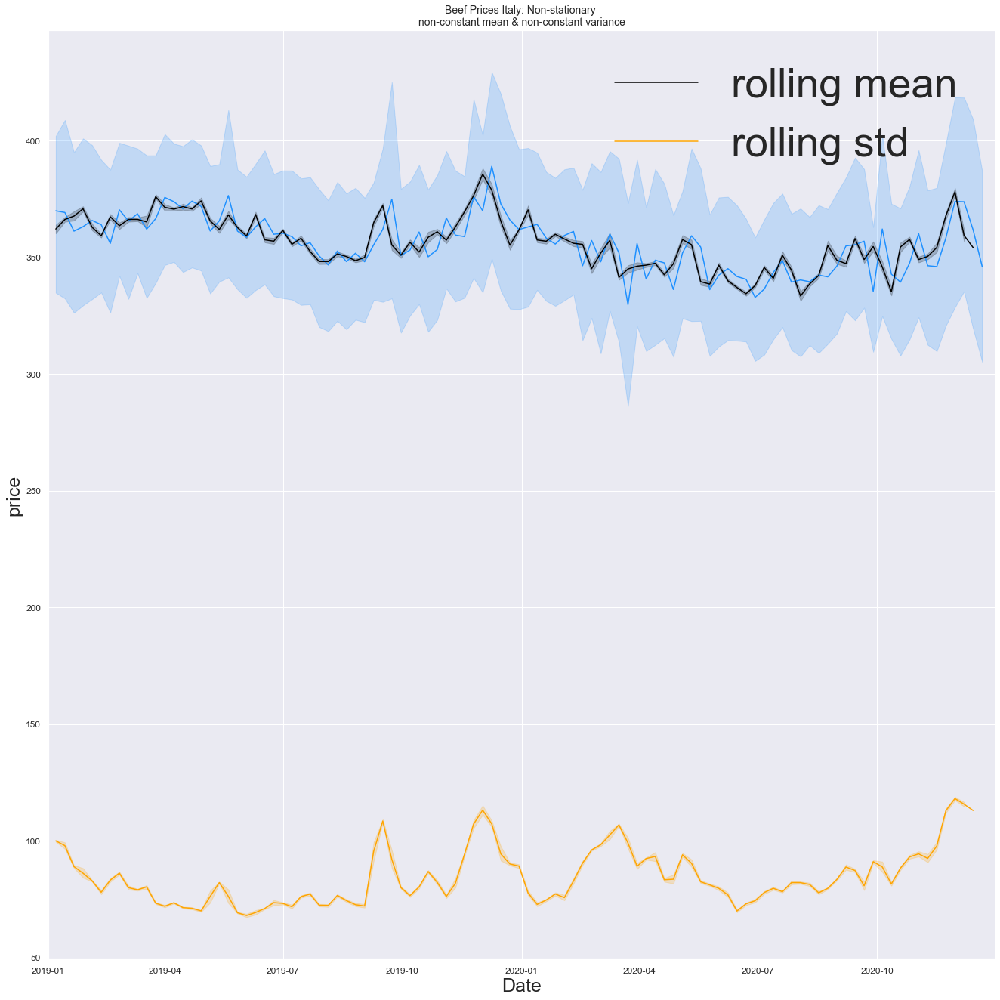

In [405]:
# A year has 52 weeks (52 weeks * 7 days per week) aporx.
rolling_window = 52
f,ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))

sns.lineplot(x=df_IT['beginDate'], y=df_IT['price'], ax=ax, color='dodgerblue')
#Plot the rolling mean of the price over time in a line plot
sns.lineplot(x=df_IT['beginDate'], y=df_IT['price'].rolling(rolling_window).mean(), ax=ax, color='black', label='rolling mean')
#Plot the rolling standard deviation of the price over time in a line plot
sns.lineplot(x=df_IT['beginDate'], y=df_IT['price'].rolling(rolling_window).std(), ax=ax, color='orange', label='rolling std')
ax.set_title('Beef Prices Italy: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax.set_ylabel(ylabel='price', fontsize=25)
ax.set_xlim(pd.to_datetime(['2019-01-01', '2020-12-31']))
ax.set_xlabel(xlabel='Date', fontsize=25)

ax.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.show()

Linear Regression - Predict price based on other values

In [237]:
df_IE['age'] = pd.to_numeric(df_IE['age'],downcast="integer")
df_IE['Fat'] = pd.to_numeric(df_IE['Fat'],downcast="integer")
df_IE['quality'] = pd.to_numeric(df_IE['quality'],downcast="integer")


C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1660657353.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1660657353.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1660657353.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

<H1> Linear SVM

In [239]:
df_IE

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat,price_per_kg
51,IE,Ireland,2020-12-21,2020-12-27,52,362.43,€/100Kg,Young cattle,Z R3,12,24,2020,Monday,8,3,3,3.6243
52,IE,Ireland,2020-12-21,2020-12-27,52,368.16,€/100Kg,Young bulls,A U3,12,24,2020,Monday,3,2,3,3.6816
53,IE,Ireland,2020-12-21,2020-12-27,52,381.05,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,3,3,3.8105
54,IE,Ireland,2020-12-21,2020-12-27,52,291.30,€/100Kg,Cows,D O4,12,24,2020,Monday,2,4,4,2.9130
55,IE,Ireland,2020-12-21,2020-12-27,52,356.97,€/100Kg,Young bulls,A R2,12,24,2020,Monday,3,3,2,3.5697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11924,IE,Ireland,2019-01-07,2019-01-13,2,373.11,€/100Kg,Heifers,E R2,1,1,2019,Monday,1,3,2,3.7311
11925,IE,Ireland,2019-01-07,2019-01-13,2,295.77,€/100Kg,Cows,D R3,1,1,2019,Monday,2,3,3,2.9577
11926,IE,Ireland,2019-01-07,2019-01-13,2,268.87,€/100Kg,Cows,D O4,1,1,2019,Monday,2,4,4,2.6887
11927,IE,Ireland,2019-01-07,2019-01-13,2,254.47,€/100Kg,Cows,D P3,1,1,2019,Monday,2,5,3,2.5447


In [240]:
df = pd.DataFrame(df_IE)

In [241]:
df

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat,price_per_kg
51,IE,Ireland,2020-12-21,2020-12-27,52,362.43,€/100Kg,Young cattle,Z R3,12,24,2020,Monday,8,3,3,3.6243
52,IE,Ireland,2020-12-21,2020-12-27,52,368.16,€/100Kg,Young bulls,A U3,12,24,2020,Monday,3,2,3,3.6816
53,IE,Ireland,2020-12-21,2020-12-27,52,381.05,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,3,3,3.8105
54,IE,Ireland,2020-12-21,2020-12-27,52,291.30,€/100Kg,Cows,D O4,12,24,2020,Monday,2,4,4,2.9130
55,IE,Ireland,2020-12-21,2020-12-27,52,356.97,€/100Kg,Young bulls,A R2,12,24,2020,Monday,3,3,2,3.5697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11924,IE,Ireland,2019-01-07,2019-01-13,2,373.11,€/100Kg,Heifers,E R2,1,1,2019,Monday,1,3,2,3.7311
11925,IE,Ireland,2019-01-07,2019-01-13,2,295.77,€/100Kg,Cows,D R3,1,1,2019,Monday,2,3,3,2.9577
11926,IE,Ireland,2019-01-07,2019-01-13,2,268.87,€/100Kg,Cows,D O4,1,1,2019,Monday,2,4,4,2.6887
11927,IE,Ireland,2019-01-07,2019-01-13,2,254.47,€/100Kg,Cows,D P3,1,1,2019,Monday,2,5,3,2.5447


In [243]:
# splitting into X and y
X = df.drop("price", axis = 1)
y = df.age.values.astype(int)


In [244]:
df["age"] = pd.to_numeric(df["age"],downcast="integer")
df["Fat"] = pd.to_numeric(df["Fat"],downcast="integer")
df["quality"] = pd.to_numeric(df["quality"],downcast="integer")

In [245]:
df.dtypes

price        float64
nb_months      int32
age             int8
quality         int8
Fat             int8
dtype: object

In [246]:
df

,price,nb_months,age,quality,Fat
51,362.43,24,8,3,3
52,368.16,24,3,2,3
53,381.05,24,1,3,3
54,291.30,24,2,4,4
55,356.97,24,3,3,2
...,...,...,...,...,...
11924,373.11,1,1,3,2
11925,295.77,1,2,3,3
11926,268.87,1,2,4,4
11927,254.47,1,2,5,3


In [247]:
from sklearn.preprocessing import scale
X = scale(X)

In [248]:
# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4)

In [249]:
# confirm that splitting also has similar distribution 
# emails
print(y_train.mean())
print(y_test.mean())


3.6939690301548493
3.776615969581749


In [250]:
# Model building

# instantiate an object of class SVC()
# note that we are using cost C=1
model = SVC(C = 1)

# fit
model.fit(X_train, y_train)

# predict
y_pred = model.predict(X_test)

In [251]:
# Evaluate the model using confusion matrix 
from sklearn import metrics
metrics.confusion_matrix(y_true=y_test, y_pred=y_pred)

array([[273,   0,   0,   0,   0,   0],
       [  0, 220,   0,   0,   0,   0],
       [  0,   0, 175,   0,   0,   0],
       [  0,   0,   0,  26,   0,   0],
       [  0,   0,   0,   0, 233,   0],
       [  0,   0,   0,   0,   0, 125]], dtype=int64)

In [252]:
# print other metrics

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred,average='micro'))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred,average='micro'))

accuracy 1.0
precision 1.0
recall 1.0


In [253]:
# Days are clssified correctly due to date
print("specificity", 1)

specificity 1


In [254]:
#K-fold

In [255]:
# creating a KFold object with 6 splits 
folds = KFold(n_splits = 6, shuffle = True, random_state = 4)

# instantiating a model with cost=1
model = SVC(C = 1)

In [256]:
# computing the cross-validation scores 
# note that the argument cv takes the 'folds' object, and
# we have specified 'accuracy' as the metric

cv_results = cross_val_score(model, X_train, y_train, cv = folds, scoring = 'accuracy') 

In [257]:
# print 6 accuracies obtained from the 6 folds
print(cv_results)
print("mean accuracy = {}".format(cv_results.mean()))

[1. 1. 1. 1. 1. 1.]
mean accuracy = 1.0


In [258]:
#Grid search to tune our params

In [259]:
# specify range of parameters (C) as a list
params = {"C": [1, 10, 100, 1000, 2000,5000]}

model = SVC()

# set up grid search scheme
# note that we are still using the 6 fold CV scheme we set up earlier
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                       return_train_score=True)  

In [260]:
# fit the model - it will fit 6 folds across all values of C
model_cv.fit(X_train, y_train)

Fitting 6 folds for each of 6 candidates, totalling 36 fits


GridSearchCV(cv=KFold(n_splits=6, random_state=4, shuffle=True),
             estimator=SVC(), param_grid={'C': [1, 10, 100, 1000, 2000, 5000]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [261]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,mean_train_score,std_train_score
0,0.032196,0.002269,0.014513,0.000501,1,{'C': 1},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,0.020270,0.000902,0.004503,0.000501,10,{'C': 10},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,0.019019,0.001002,0.003671,0.000470,100,{'C': 100},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,0.018769,0.000992,0.003505,0.000499,1000,{'C': 1000},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,0.018607,0.000611,0.003346,0.000473,2000,{'C': 2000},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
5,0.018684,0.000746,0.003671,0.000472,5000,{'C': 5000},1.0,1.0,1.0,1.0,...,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0


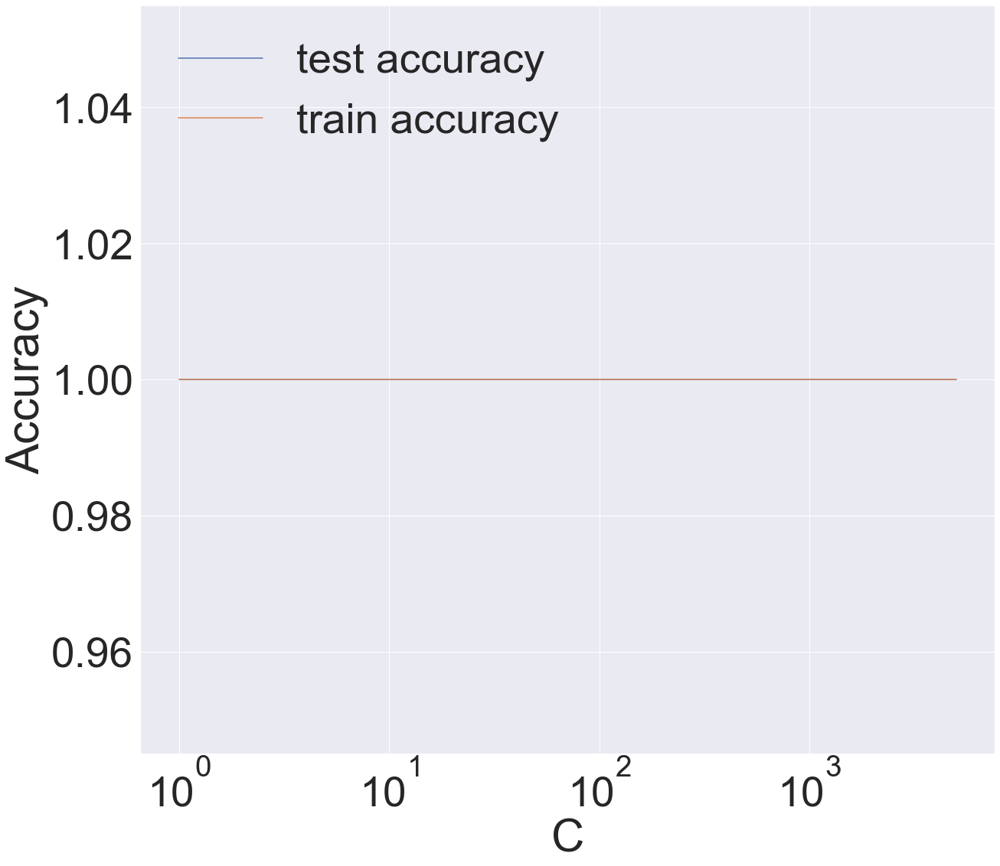

In [266]:
# plot of C versus train and test scores

plt.figure(figsize=(20, 18))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [263]:
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test accuracy is {0} at C = {1}".format(best_score, best_C))

 The highest test accuracy is 1.0 at C = 1


In [264]:
# metrics
# print other metrics

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred , average="micro"))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred,average="micro"))

accuracy 1.0
precision 1.0
recall 1.0


<h1>Decision Tree

In [267]:
# First, import the necessary libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Separate the input features and target variable
X = df[['price', 'Fat', 'quality']]
y = df['age']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the decision tree classifier
clf = DecisionTreeClassifier()

# Define the parameter grid
param_grid = {
    'max_depth': [2, 4, 6, 8, 10],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8, 10]
}

# Create the grid search object
grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=5, n_jobs=-1)

# Fit the grid search object to the training data
grid_search.fit(X, y)

# Get the best combination of hyperparameters
best_params = grid_search.best_params_
print('Best hyperparameters:', best_params)

# Get the best score
best_score = grid_search.best_score_
print('Best score:', best_score)

Best hyperparameters: {'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best score: 0.5661622996858375


Linear Regression

In [268]:
from sklearn.linear_model import LinearRegression


# Separate the input features and the target variable
X = df[['Fat', 'age', 'quality']]
y = df['price']

# Create the model
model = LinearRegression()

# Fit the model to the data
model.fit(X, y)

# Use the model to make predictions
predictions = model.predict(X)

print(predictions)

[345.79590771 368.58576909 339.29867365 ... 317.23293246 285.36536424
 372.29847427]


In [269]:
from sklearn.metrics import mean_absolute_error

# Calculate the mean absolute error
mae = mean_absolute_error(y, predictions)
print('Mean Absolute Error:', mae)

Mean Absolute Error: 23.397646668842487


<H1> ARIMA Price Prediction

In [270]:
df_IE

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode,Month,nb_months,Year,Day,age,quality,Fat,price_per_kg
51,IE,Ireland,2020-12-21,2020-12-27,52,362.43,€/100Kg,Young cattle,Z R3,12,24,2020,Monday,8,3,3,3.6243
52,IE,Ireland,2020-12-21,2020-12-27,52,368.16,€/100Kg,Young bulls,A U3,12,24,2020,Monday,3,2,3,3.6816
53,IE,Ireland,2020-12-21,2020-12-27,52,381.05,€/100Kg,Heifers,E R3,12,24,2020,Monday,1,3,3,3.8105
54,IE,Ireland,2020-12-21,2020-12-27,52,291.30,€/100Kg,Cows,D O4,12,24,2020,Monday,2,4,4,2.9130
55,IE,Ireland,2020-12-21,2020-12-27,52,356.97,€/100Kg,Young bulls,A R2,12,24,2020,Monday,3,3,2,3.5697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11924,IE,Ireland,2019-01-07,2019-01-13,2,373.11,€/100Kg,Heifers,E R2,1,1,2019,Monday,1,3,2,3.7311
11925,IE,Ireland,2019-01-07,2019-01-13,2,295.77,€/100Kg,Cows,D R3,1,1,2019,Monday,2,3,3,2.9577
11926,IE,Ireland,2019-01-07,2019-01-13,2,268.87,€/100Kg,Cows,D O4,1,1,2019,Monday,2,4,4,2.6887
11927,IE,Ireland,2019-01-07,2019-01-13,2,254.47,€/100Kg,Cows,D P3,1,1,2019,Monday,2,5,3,2.5447


In [271]:
df_IE_heifers =  df_IE[df['age'] == 1]
df_IE_cows =  df_IE[df['age'] == 2]
df_IE_ybulls =  df_IE[df['age'] == 3]

In [272]:
def ARIMA(df_IE):

    df_IE.sort_values(by='nb_months', inplace=True)

    # Separate the input features and the target variable
    X = df_IE[['Fat', 'age', 'price_per_kg', 'quality']]
    y = df_IE['price']

    # Fit an ARIMA model to the data
    model = sm.tsa.ARIMA(y, order=(1, 1, 1))
    model_fit = model.fit()

    # Make predictions using the model
    predictions = model_fit.predict(start=len(y), end=len(y)+6)
    # Add a title and axis labels
    plt.title('ARIMA model predictions')
    plt.xlabel('Date')
    plt.ylabel('Price')

    # Plot the predictions
    plt.plot(predictions,color='orange')
    plt.show()

In [273]:
# Plot the actual values and the predictions
def plotARIMA(df):  
    df['price'].plot()
    predictions.plot(color='orange')
    # Add a title and axis labels
    plt.title('ARIMA model predictions')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.show()

C:\Users\Ethan\AppData\Local\Temp\ipykernel_21460\1535391205.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an inte

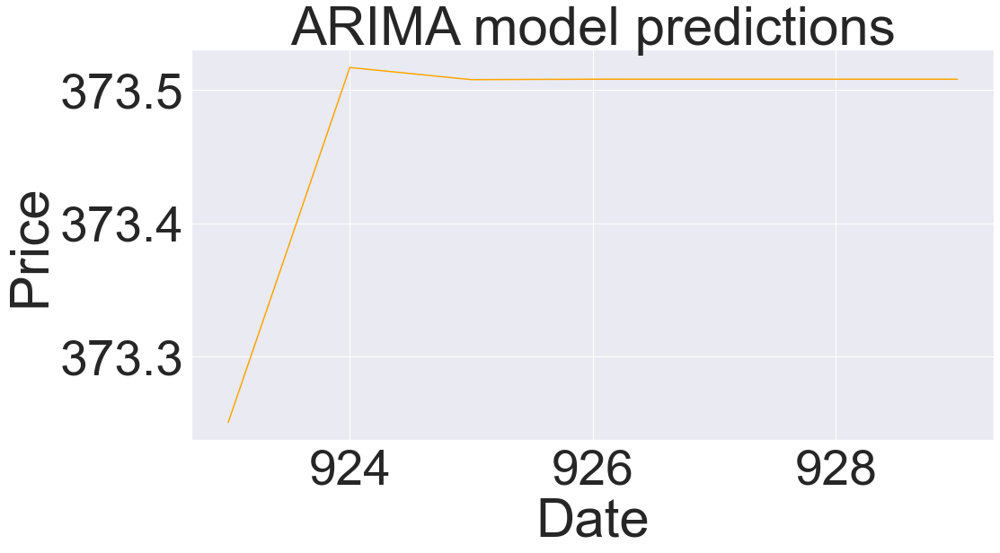

In [274]:
ARIMA(df_IE_heifers)

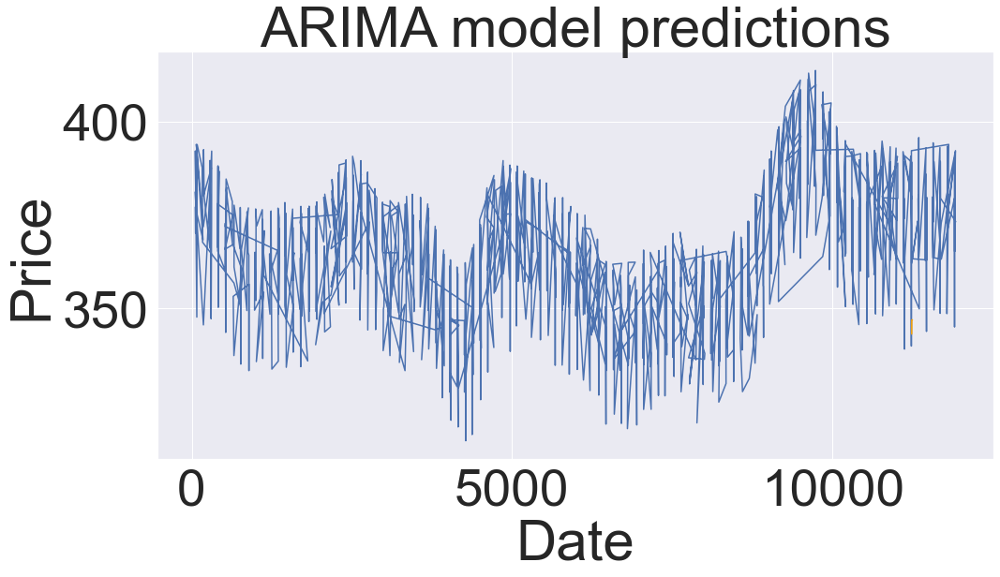

In [411]:
plotARIMA(df_IE_heifers)

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\Ethan\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



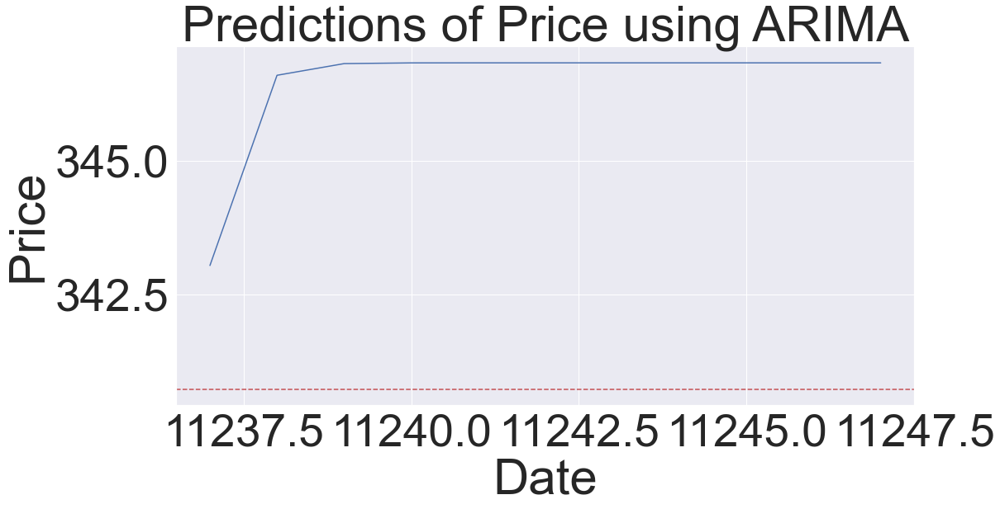

In [276]:
 
#df_beef_stats['beginDate'] = pd.to_datetime(df_beef_stats['beginDate'])
#df_beef_stats.sort_values(by='beginDate', inplace=True)
#df_beef_stats.set_index('beginDate', inplace=True)

# Separate the input features and the target variable
X = df_beef_stats[['Fat', 'age', 'price_per_kg', 'quality']]
y = df_beef_stats['price']

# Fit an ARIMA model to the data
model = sm.tsa.ARIMA(y, order=(1, 1, 1))
model_fit = model.fit()

# Make predictions using the model
predictions = model_fit.predict(start=len(y), end=len(y)+10)

# Calculate the average price
avg_price = y.mean()

# Create a figure and axis
fig, ax = plt.subplots()

# Plot the predictions
ax.plot(predictions)

# Add a horizontal line for the average price
ax.axhline(avg_price, color='r', linestyle='--')

# Add titles and labels
ax.set_title('Predictions of Price using ARIMA')
ax.set_xlabel('Date')
ax.set_ylabel('Price')

# Show the plot
plt.show()

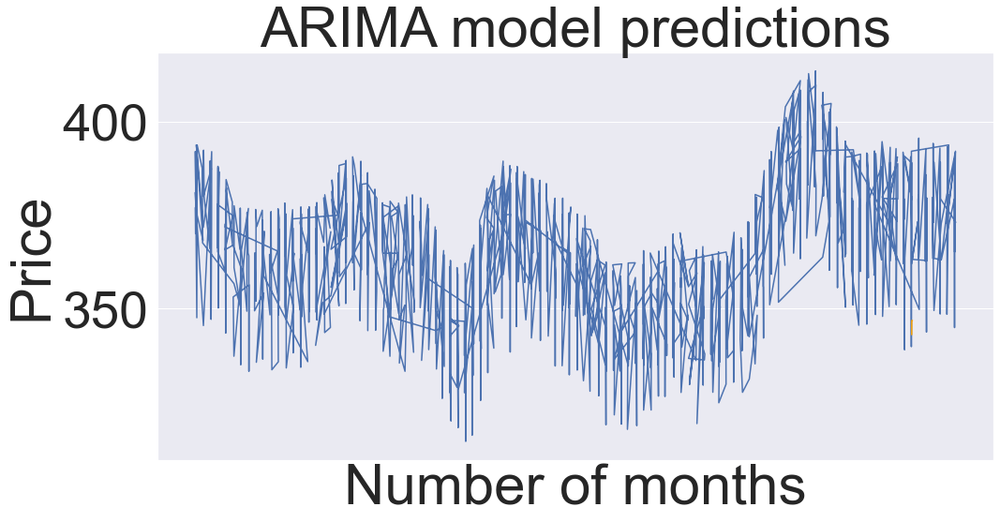

In [277]:
x_values = df_IE_heifers['nb_months'][len(y):]

# Plot the original data and the predictions
df_IE_heifers['price'].plot()
predictions.plot(color='orange')

# Set the x-axis values
plt.xticks(x_values)

# Add a title and axis labels
plt.title('ARIMA model predictions')
plt.xlabel('Number of months')
plt.ylabel('Price')

plt.show()

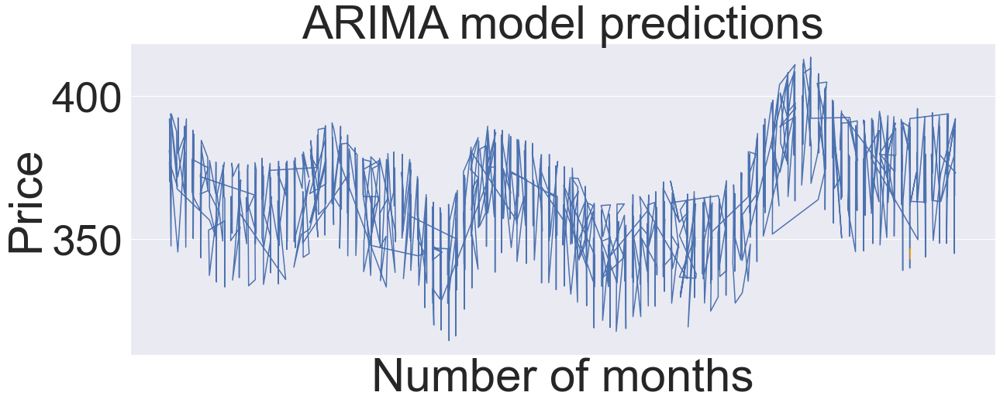

In [278]:
# Get the values for the x-axis
x_values = df_IE_heifers['nb_months'][len(y):]

# Create a figure with a scrollable x-axis
fig, ax = plt.subplots(figsize=(20,20))
fig.subplots_adjust(bottom=.6)

# Plot the original data and the predictions
df_IE_heifers['price'].plot(ax=ax)
predictions.plot(color='orange', ax=ax)

# Set the x-axis values
plt.xticks(x_values)

# Add a title and axis labels
plt.title('ARIMA model predictions')
plt.xlabel('Number of months')
plt.ylabel('Price')

plt.show()